# 2020.07.25_furyroad_pca
----

* fury road on ETF pca data



---
## History
#### 2020.07.22_furyroad_generalizing
* resuming furyroad after coming back from montana
* i seemed to have fucked it up badly in refactoring


#### 2020.07.05_furyroad_generalizing

* Generalizing furyroad / colossus to support running arbitrary corpii in chained sequences
* Will think abotu parallelization

#### 2020.06.27_furyroad_with_minibatches
* adding minibatch support to all the furyroad and online operators
* tested the gamma corpus
* tested chaining the corpii

#### 2020.06.19_starting_furyroad

* Initial research with furyroad (corpus colossus)
* I renanmed furyroad to be OnlineBooster and renamed the CorpusColussus package as furyroad


#### 2020.06.18_corpus_colossus ( no progress here)

* Was fooling around with  corpus colossus idea but renamed that whole idea to be furyroad
* Generated some interesting baselines


#### 2020.06.12_furyroad

* Testing disjoint 1 day returns as prediction targets
* sequential boosting with furyroad


#### 2020.06.10_refactored_rnns
refactored the rnns to support single step updates. Will test these

#### 2020.06.08_baselines_again
Since I am a total fucking retard and I delete all important shit - I'm going to waste anotehr day regenerating this fucking shit

Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization


#### 2020.06.04_recap
Recap of all models to date
*   basic online model with rolling window (no technical features)
*  disjoint returns
*   online learning with Q and P-omega weights
* boosting / sequential residualization



In [1]:
# preamble
%alias_magic  nbagg matplotlib -p nbagg
%alias_magic  inline matplotlib -p inline
%load_ext memory_profiler
%load_ext line_profiler

from pylab import *
from madmax.api import *
mx = mx.reload()
mxtr = mxtr.reload()
plt.style.use('seaborn-whitegrid')

###################################################################
# Interactive configuration
# When running a config grid this will throw a FrozenException
# and the grid Config will be used
###################################################################
try:
    Config = mx.Configuration(
        name = 'etf_technical/2020.07.05_furyroad_generalizing/',
        mode = 'interactive',
        hps = mx.HPSet(
            start='20070101',
            end='20200501',
        ),
        code = '2020.07.05_furyroad_generalizing.ipynb',
        tb_port=6006,
    )
    disp('Running interactive configuration ', h=2)
except mx.Configuration.FrozenException:
    if Config.mode != 'grid':
        raise RuntimeError('An unexpected configruation encountered')
    disp('Running a grid configuration ', h=2)

device = 'cuda'
dtype = tr.float32
Config.start()



# to run run a grid of hyperparameters ...
####################################
# # hyperparameters
# mx.Config.hps = fr.HPSet(
# )
# mx.Config.code = ''
# # configs = []
# # for obs_weight in ['no_weight', 'dollar_weight', 'log_weight']:
# #     cfg = fr.Config.clone()
# #     cf
# #     cfg.hps = cfg.hps.clone( obs_weight=obs_weight )
# #     cfg.freeze()
# #     display_html( cfg )
# #     configs.append( cfg )
# # notebook = fr.Config.run_grid( configs, outfile=fr.Config.uri+'/../cadre_price_index.20200302 - weight_grid_results.ipynb', n_jobs=None )

Created `%nbagg` as an alias for `%matplotlib nbagg`.
Created `%inline` as an alias for `%matplotlib inline`.


<IPython.core.display.Javascript object>

<h1> Config etf_technical/2020.07.05_furyroad_generalizing/ </h1>
<b> hash</b>: config.none </h4>
<b> mode </b>: interactive
<b> frozen </b>: False
<b> uri </b>: /home/fj/experiments/etf_technical/2020.07.05_furyroad_generalizing/config.none
<b> tb_port </b>: 6006
<h3> Hyperparameters </h3>
HPSet(
		end='20200501',
		start='20070101',
	)<h3> Code </h3>
<b> format </b>: .ipynb
<b> code </b> : /local/cloud/code/research/etf_technical/2020.07.05_furyroad_generalizing.ipynb

## interactive global hyperparameters

In [2]:
# global  configruation
#######
if Config.mode == 'grid':
    raise Config.FrozenException( 'running grid configruation - skipping')

hps = Config.hps

hps.universe = mx.HPSet(
    start = '20100101',
    end='20200401',
    min_count=2000,
    min_dollar_vol=1e5
)


hps.feature_set = mx.HPSet(
    unadj_prices=[
        'open_unadj_30min', 'high_unadj_30min', 'low_unadj_30min', 'close_unadj_30min', 'mid_unadj_30min',
        'log_open_unadj_30min', 'log_close_unadj_30min',
    ],
    adj_prices=[
        'open_adj_30min', 'high_adj_30min', 'low_adj_30min', 'close_adj_30min',
        'mid_adj_30min', 'mid_adj_0D.12h.vwap', 'mid_adj_2D.12h.vwap', 'mid_adj_5D.vwap',
        'open_adj_0D.12h', 'high_adj_0D.12h', 'low_adj_0D.12h',
        'open_adj_2D.12h', 'high_adj_2D.12h', 'low_adj_2D.12h',
        'open_adj_5D', 'high_adj_5D', 'low_adj_5D',
    ],
    rel_prices=[
        'rel_price_260', 'rel_price_780', 'rel_price_3276',
    ],
    volumes=[
        'volume_unadj_30min', 'dollar_volume_unadj_30min', 'avg_dollar_volume',
    ],
    log_volumes=[
        'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid',
    ],
    rel_volume=[
        'rel_dollar_volume_260', 'rel_dollar_volume_780',
        'rel_dollar_volume_3276',
    ],
    calendar=[
        'timeofday', 'cos1_timeofday', 'cos2_timeofday', 'cos4_timeofday',
        'dayofweek', 'cos1_dayofweek', 'cos2_dayofweek',
        'weekofmonth', 'cos1_weekofmonth', 'cos2_weekofmonth',
        'monthofquarter', 'cos1_monthofquarter', 'cos2_monthofquarter',
        'quarterofyear', 'cos1_quarterofyear', 'cos2_quarterofyear',
    ],
    lagging=[
        'lagrtn_adj_30min', 'lagrtn_adj_1hr', 'lagrtn_adj_1day',
        'lagrtn_adj_30min_resid',
    ],
    mkt=[
        'mkt_lagrtn_30min',
        'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',
    ],
    vol=[
        'lagrtn_adj_30min_260.rw_sd', 'lagrtn_adj_30min_780.rw_sd', 'lagrtn_adj_30min_3276.rw_sd',
        'lagrtn_adj_30min_resid_260.rw_sd', 'lagrtn_adj_30min_resid_780.rw_sd', 'lagrtn_adj_30min_resid_3276.rw_sd',
    ],
    zscores=[
        'lagrtn_adj_30min_260.rw_zscore', 'lagrtn_adj_30min_780.rw_zscore', 'lagrtn_adj_30min_3276.rw_zscore',
        'lagrtn_adj_30min_resid_260.rw_zscore', 'lagrtn_adj_30min_resid_780.rw_zscore',
        'lagrtn_adj_30min_resid_3276.rw_zscore',
    ],
    betas=[
        'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_30min_2340.ew_beta',
        'lagrtn_adj_30min_3276.ew_beta', 'lagrtn_adj_30min_6500.ew_beta',
    ],
    afacs=[ 'bw_afac_30min', 'fw_afac_30min' ],
    technical=[
        'true_range_30min', 'true_range_0D.12h', 'true_range_2D.12h', 'true_range_5D',
        'direction_30min', 'direction_0D.12h', 'direction_2D.12h', 'direction_5D',
        'delta_rtn_30min', 'delta_rtn_0D.12h', 'delta_rtn_2D.12h', 'delta_rtn_5D',
        'ttp_high_adj_0D.12h', 'ttp_high_adj_2D.12h', 'ttp_high_adj_5D',
        'ttp_low_adj_0D.12h', 'ttp_low_adj_2D.12h', 'ttp_low_adj_5D',    
    ],    
    # features in teh daily dataset
    unadj_prices_daily=['open_unadj_30min_13.rw_mean'],
    lagging_daily=['lagrtn_adj_1day', 'lagrtn_adj_30min_resid_13.rw_mean',],
    mkt_daily=[ 'mkt_lagrtn_1day',  'mkt_lagrtn_30min_260.rw_sd', 'mkt_lagrtn_30min_780.rw_sd', 'mkt_lagrtn_30min_3276.rw_sd',],
    volumes_daily=['volume_unadj_30min_13.rw_mean', 'dollar_volume_unadj_30min_13.rw_mean', ],
    log_volumes_daily=[ 'log10_dollar_volume_30min_13.rw_mean', 'log10_dollar_volume_30min_resid_13.rw_mean'],
    afacs_daily=[ 'bw_afac_30min_13.rw_mean', 'fw_afac_30min_13.rw_mean', ],
)

hps.leading_rtns = [
    'leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day',
    'mkt_leadrtn_30min', 'mkt_leadrtn_1day',
    'leadrtn_adj_30min_disjoint.1', 'leadrtn_adj_30min_disjoint.2', 'leadrtn_adj_30min_disjoint.3',
]

hps.leading_rtns_daily = [
  'leadrtn_adj_1day', 'mkt_leadrtn_1day', 'leadrtn_adj_1day_disjoint_30min', 
]

hps.weights = ['valid_30min', 'weight', ]  


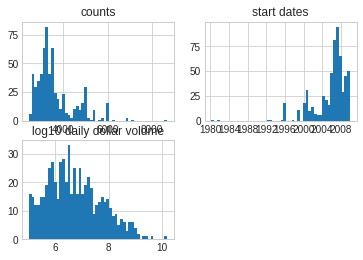

In [3]:
# identify the universe of ETFS
#############################################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )

etf_stats = etfd.compute_etf_stats()
etf_stats = etf_stats[etf_stats.vendor=='kibot']
orig_len = len( etf_stats )
# drop etfs without enough history
etf_stats = etf_stats[(etf_stats['start'] <= hps.universe.start ) 
                      & (etf_stats['end'] > hps.universe.end ) 
                      & (etf_stats['n'] >= hps.universe.min_count)
                      & (etf_stats['daily_dollar_volume_adj'] >= hps.universe.min_dollar_vol ) ]

disp( 'after filtering', len( etf_stats ), 'symbols out of original ' ,orig_len )

etf_stats = (etf_stats
             .merge( etfd.all_etfs, how='left', left_on='symbol', right_on='Symbol' )
             .drop( columns=['Symbol', 'ETP Name', 'Leveraged / Inverse' ])
             .rename( columns={'Asset Class':'asset_class', 'Description':'name'} )
             .fillna( 'Not Specified')             
             .set_index('symbol')
            )
disp( etf_stats.groupby('asset_class').name.count() )

ax = subplot( 2,2, 1 )
etf_stats.n.hist(ax=ax, bins=50)
ax.set_title( 'counts')

ax = subplot( 2,2, 2 )
etf_stats.start.hist(ax=ax, bins=50)
ax.set_title( 'start dates')

ax = subplot( 2,2, 3 )
etf_stats.daily_dollar_volume_adj.log10().hist(ax=ax, bins=50)
ax.set_title( 'log10 daily dollar volume')

# this is the universe we will work with. 
# HERO has a massive returns spike in 2015.11.09 - which throws off residualization quite a bit.
hps.universe.symbols = sorted( etf_stats.index.values )


In [4]:
# build up the data and features
#############################################
%inline
from research.etf_technical import etf_data_apr2020 as etfd; reload( etfd )
from research.etf_technical import etf_technical_20200517 as etfrc; reload( etfrc )

# fetch the data as a dataarray
builder = etfd.BuildDataWithAfacs( symbols=hps.universe.symbols, mkt_only=True, start=hps.start ,).set( memoize=True )
builder.data = None
disp( 'builder BuildDataWithAfacs_7f79ef4bf  expected got', builder.hash() )
da = builder(  )
df = builder.output_meta

# hyperparams related to computing returns and residuals
hps.returns_hps = mx.HPSet(    
    price_windows=[ 24*1, 24*5, 24*10],
    beta_halflifes=[13 * 90, 13 * 180, 13 * 252, 13*500],
    dollar_volume_window=13*180,
    ema_halflifes=[20 * 13, 60 * 13, 252 * 13],
    resid_halflife=13,
    
)
# compute log-returns, log-dollar-volume, betas, residual returns and clean up the data
rtn_computer = etfrc.compute_returns_and_betas( 
    start=hps.start, end=None,     
    dollar_volume_window=hps.returns_hps.dollar_volume_window, 
    price_windows = hps.returns_hps.price_windows,
    beta_halflifes=hps.returns_hps.beta_halflifes, 
    resid_halflife=None,    
) 
rtn_computer.data = builder
disp( 'expected compute_returns_and_betas_ea966833a got', rtn_computer.hash(), h=4, color='teal' )

# add relative price and relative volume features
rel_price_and_vols = etfrc.add_relative_price_and_volumes( emas=hps.returns_hps.ema_halflifes )
rel_price_and_vols.data = rtn_computer
disp( 'expected add_relative_price_and_volumes_a65da371a got', rel_price_and_vols.hash(), h=4, color='teal' )

# add volatility and calendar features
add_vols = etfrc.add_volatilities( emas=hps.returns_hps.ema_halflifes )
add_vols.data = rel_price_and_vols
disp( 'expected add_volatilities_77ca914f0 got', add_vols.hash(), h=4, color='teal' )

# add disjoint returns
disjoint_returns= etfrc.add_dijoint_returns( lags=(1, 2, 3) )
disjoint_returns.data = add_vols
disjoint_returns.features = ['leadrtn_adj_30min', 'leadrtn_adj_1hr', 'leadrtn_adj_1day', 'lagrtn_adj_30min' ]
disp( 'expected add_dijoint_returns_361e1f0b0 got', disjoint_returns.hash(), h=4, color='teal' )
da = disjoint_returns(   )


# build daily data
daily_data = etfrc.build_daily_data( timeofday=dt.time(16,) ).set(memoize=True)
daily_data.data = disjoint_returns
daily_data.features = ['volume_unadj_30min', 'dollar_volume_unadj_30min', 'lagrtn_adj_30min_resid', 'bw_afac_30min', 'fw_afac_30min', 'open_unadj_30min',  
                       'log10_dollar_volume_30min', 'log10_dollar_volume_30min_resid' ]
disp( 'expected build_daily_data_46a83a0b7 got', daily_data.hash(), h=4, color='teal' )
dda = daily_data()

# Add PCA features
----
* do this at 30min freq and then downsample to daily

In [5]:
## add pca features to the 30min data and then downsample to the daily data
########################################
mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )

# global hps
phps = mx.HPSet(
    targets='lagrtn_adj_30min',
    weight='valid_30min',
    ortho_features=['valid_30min'] + hps.feature_set.betas, # take out tilt and market
    batch_size=5000,
    start='20070301',
    end=hps.end,
    ints_per_day=13,    
    # online pca params
    halflife=30 * 13,
    rank=2,
    kappa=1e-1,
    ortho=1,
    tv=None,
    ortho_halflife=None,    
    ridge=1e-6,
    plots=True,
)

from research.etf_technical import furyroad_runner as frr; reload( frr )
disp( mx.tensorboard.kill_server( ) )
disp( mx.tensorboard.start( clear=True ) )    
disp( mx.tensorboard.start_server( ) )


@mx.operatorize( consumes_features=False, produces_features=True, produces_meta=True, memoize=True )
def build_boosted_pca_features( data, input_data, phps ):
    # a boosted sequence of pca runners
    data = mx.Source.dataarray( input_data )
    output_factors = []
    output_eigens = []
    output_meta = {}
    for target in ['lagrtn_adj_30min', 'lagrtn_adj_1day']:
        for halflife in [10, 30, 90, 252]:
            with mx.timer( f'running pca {target} {halflife}' ):
                # chain the ortho features, the data and convert halflife days into intervals
                pca_runner = frr.OnlinePCARunner(
                    weight=phps.weight, rank=phps.rank, kappa=phps.kappa, ridge=phps.ridge, tv=phps.tv,  halflife=halflife*phps.ints_per_day,                     
                    ortho_features=phps.ortho_features+output_factors, ortho=phps.ortho, ortho_halflife=phps.ortho_halflife,
                    suffix=f'_{target}_hl.{halflife}d', start=phps.start, end=phps.end, 
                    batch_size=1000 if (target=='lagrtn_adj_1day' and halflife==252) else phps.batch_size, 
                    dtype=dtype, device=device,
                ).set( memoize=True, data=data, features=target )                 
                disp( pca_runner.hash(), halflife, target, h=3 )
                # chain the data for the next iteration
                da = pca_runner()
                output_factors += pca_runner.output_meta['output_factors']
                output_eigens += pca_runner.output_meta['output_eigens']
                output_meta['pca_runner_{target}_{halflife}d'] = pca_runner.output_meta
                data = pca_runner
                if phps.plots:                    
                    disp( 'created ', output_factors )
                    disp( 'orthogonalize ', pca_runner.ortho_features )
                    for key in ['pnl', 'ics', 'oics', 'ac1s']:
                        disp( key, pca_runner.output_meta[key], h=4 )
    output_meta['output_factors'] = output_factors
    output_meta['output_eigens'] = output_eigens
    return da, output_factors, output_meta

boosted_pca = build_boosted_pca_features( phps=phps, input_data=disjoint_returns.checkpointer.find('output_data').filename[0] )
boosted_pca.data = None
boosted_pca.memoize=True
disp( 'expected build_boosted_pca_features_bd0236ba4 got', boosted_pca.hash(), color='magenta' )
da = boosted_pca()

# assign the features
hps.feature_set.pca_features = sorted(set(boosted_pca.output_meta['output_factors']))

#inner join with teh daily dataset
daily_boosted_pca = mx.ConcatFeatures( daily_data, boosted_pca, join='inner', verbose=True )
disp( 'expected FeatureConcater_1c333759b got', daily_boosted_pca.hash(), color='red' )
dda = daily_boosted_pca()

if False:
    disp( 'profile the pca features', h=2 )
    X = dda.loc[:,:, hps.feature_set.pca_features]
    Y = dda.loc[:,:,'lagrtn_adj_1day']
    W = dda.loc[:,:,'valid_30min']
    r2 = (X * Y * W).mean(dim='symbol').sq() / ( (X.sq()*W).mean(dim='symbol') * (Y.sq()*W).mean(dim='symbol') + 1e-12 )
    fig = figure( figsize=(10,10) )
    for i, x in enumerate( r2.features.values ):
        ax = subplot( 4, 4, i+1 )
        ax.plot( r2.loc[:,x].to_series().rolling(100).mean().sqrt() * 100 , '-' )
        ax.set_title( x, fontsize=12 )
    fig.suptitle( 'IC for daily pca')
    disp( fig )

    profiler = (mx.FeatureProfiler(  returns=['lagrtn_adj_1day', 'leadrtn_adj_1day'], weight='valid_30min', xs=None, winsorize=None,
                                    autocorr=[1,2], remove_intercept=False  )
                  .set( verbose=False, data=daily_boosted_pca, features=hps.feature_set.pca_features, ) )
    profiler.display()



# Testing feature-subsets + furiosa with more advanced ensembling capacity

# Colossus_bbcb7cb58
## bilinear centauri with tech features (follows Colossus_8d02157d6) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,0.062825,1.453403,0.019080,0.000364,23.628237,2.105194,0.895703,0.874051,0.688673
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,0.062825,1.245825,0.009293,0.000086,11.491223,0.781436,0.895703,0.874051,0.688673


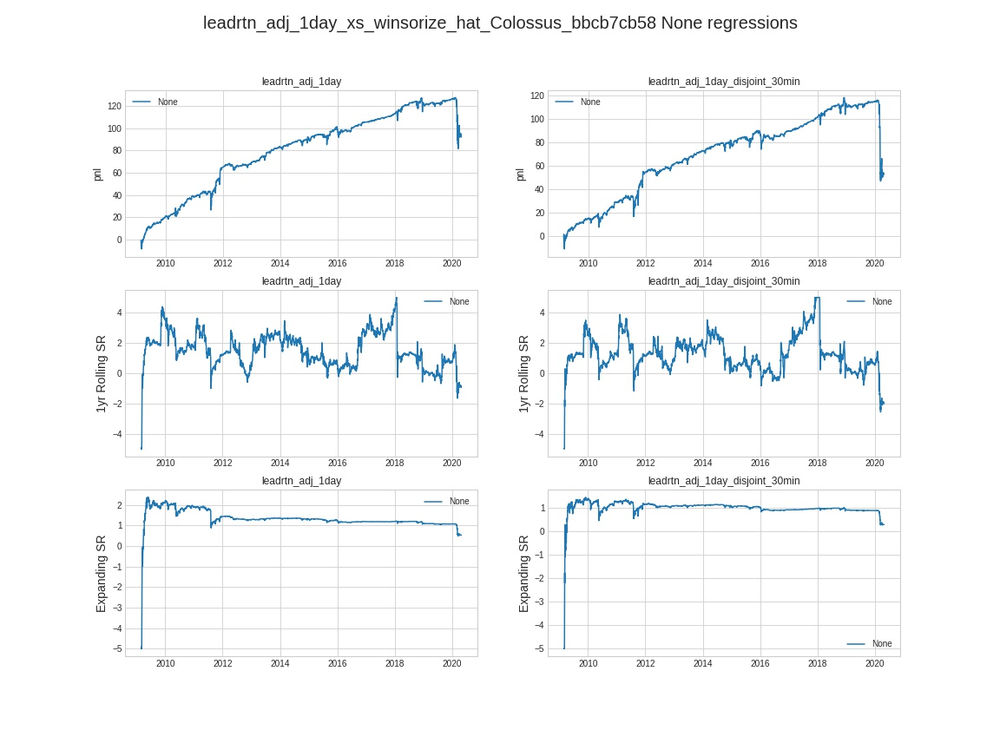

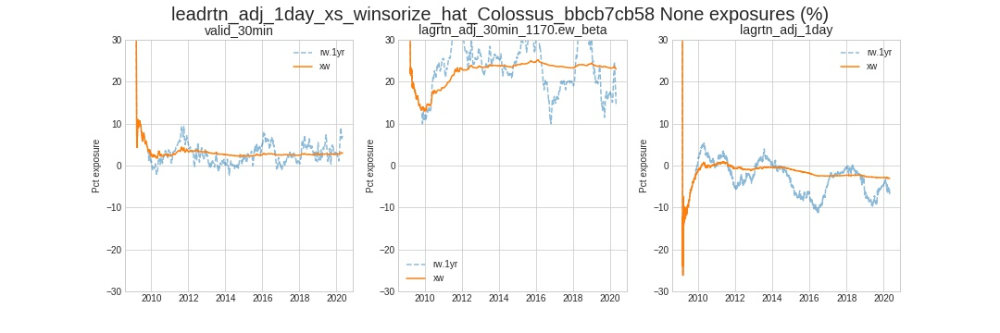

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_5ac68dd7d,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_dd146ad98,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_215a08b77,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_8d02157d6,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_bbcb7cb58,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.850959,0.180972,0.923577,0.421246
fcst_1,0.850959,1.000000,0.124575,0.777923,0.333714
fcst_2,0.180972,0.124575,1.000000,0.225656,0.549585
fcst_3,0.923577,0.777923,0.225656,1.000000,0.425463
fcst_4,0.421246,0.333714,0.549585,0.425463,1.000000


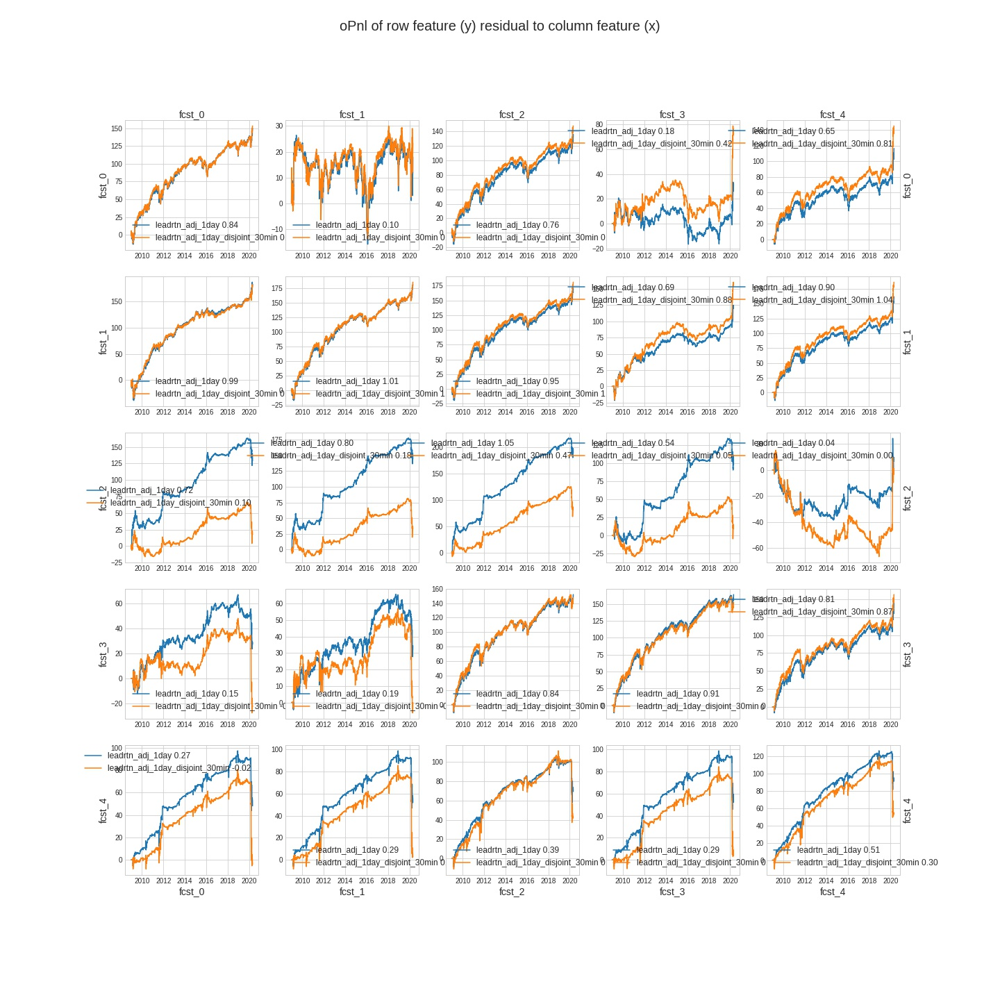

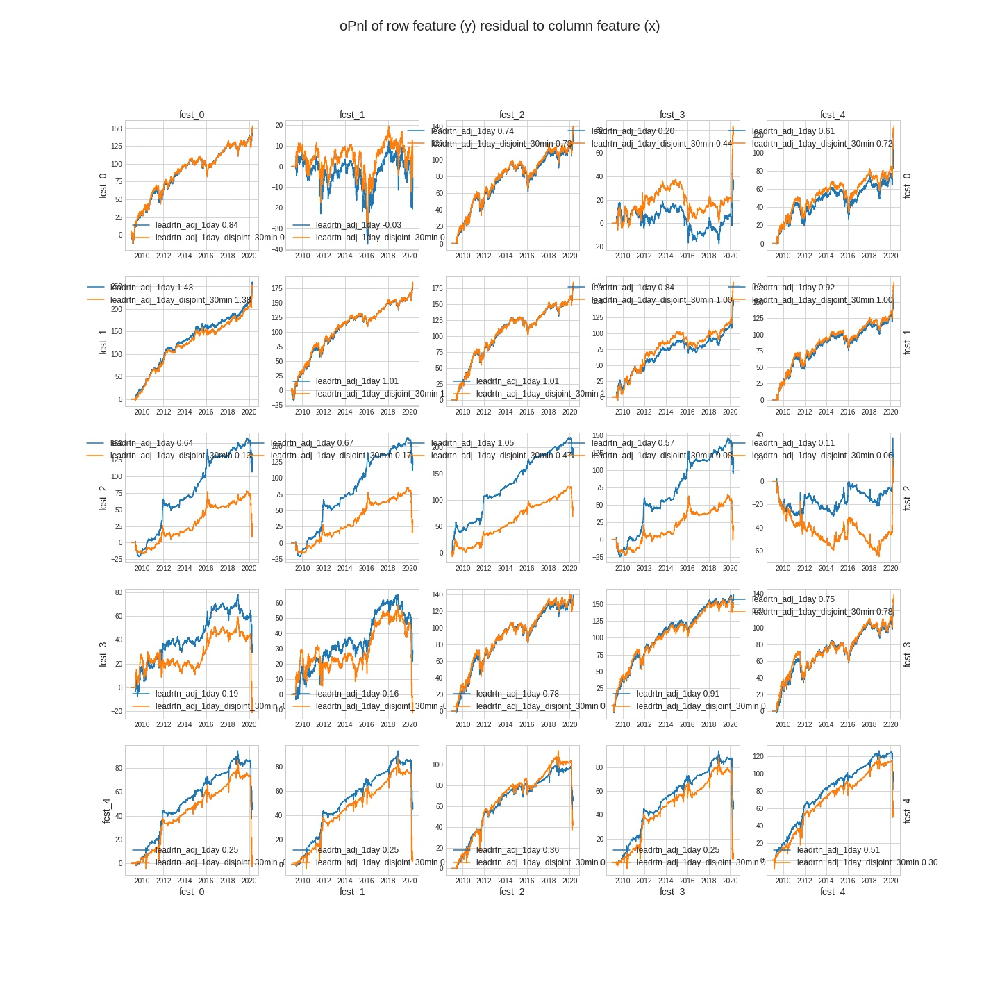

In [9]:
# Colossus_bbcb7cb58
############################################################################
BASELINE_NAME = 'Colossus_bbcb7cb58'
PREV_BASELINE = 'Colossus_8d02157d6'
BASELINE_NOTES = 'bilinear centauri with tech features'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        # + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(        
        end_to_end=False, minibatch=20, batch_size=3000, burn_in=(2,3000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)


# --- build up the corpii with feature subsets ---
# # create centauri's with different feature subset selectors at the head
# build feature subset transformers
centauri_proto = mx.HPSet( 
    type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, rank=None,
    transformer = [ 
        mx.HPSet( type='wins', quantiles=0.05 ),  
        mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
    hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
)
if True:
    phps.colossus.corpii.insert( 0, centauri_proto )
else:
    mx.online = mx.online.reload()
    feature_subsets, counts = mx.online.OnlineSubset.build( num_features=len( phps.features ), num_subsets=6, features_per_subset=len( phps.features )//3, seed=8 )
    for fi, fs in enumerate( feature_subsets ):
        centauri = centauri_proto.clone( )
        centauri.transformer = [fs.spec] + [tf.clone() for tf in centauri.transformer]
        phps.colossus.corpii.insert( 0, centauri )

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_f903007e3
## bilinear centauri with tech features, larger minibatch and num_its=4 (follows Colossus_bbcb7cb58) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,-0.00452,0.927226,0.013485,0.000182,16.698597,0.927095,0.680461,0.604232,0.417063
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,-0.00452,0.748346,0.005720,0.000033,7.073760,0.365199,0.680461,0.604232,0.417063


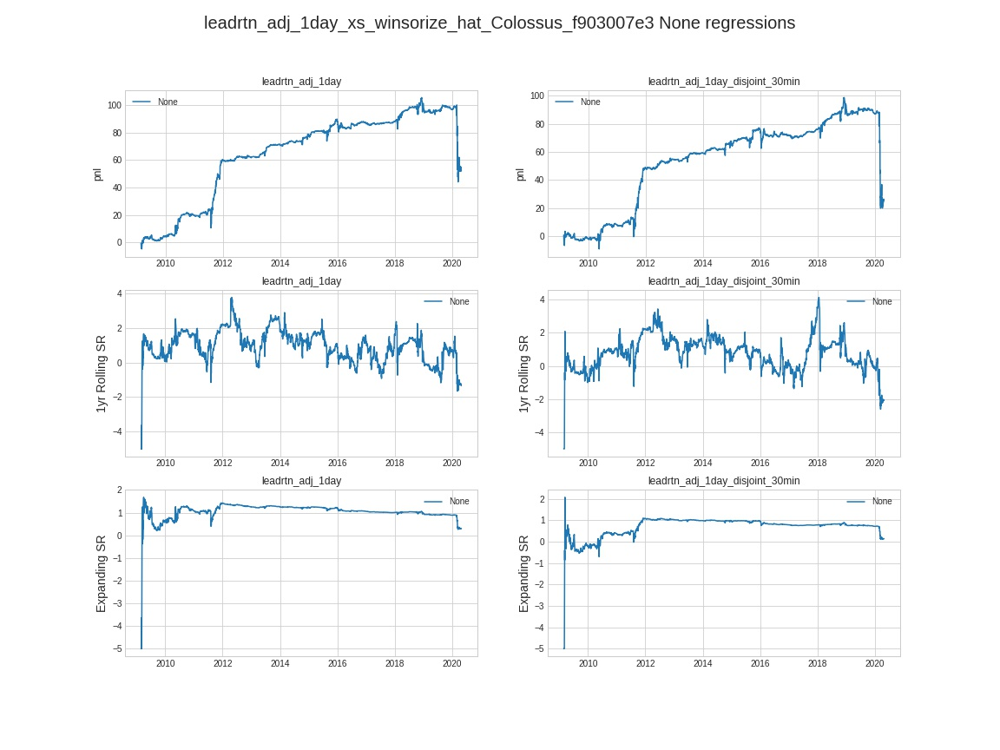

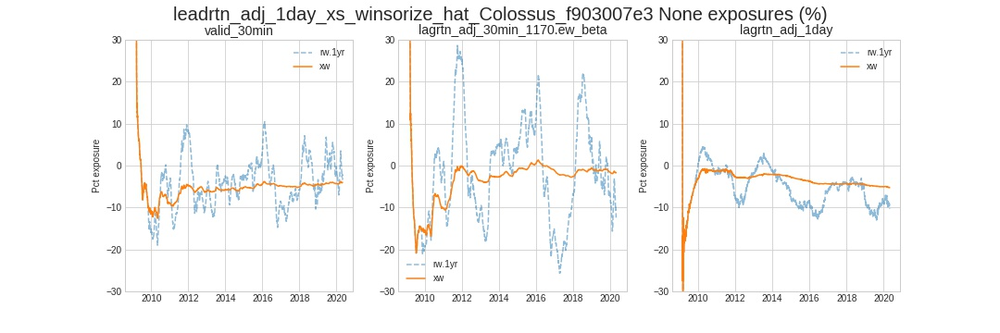

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_dd146ad98,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_215a08b77,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_8d02157d6,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_bbcb7cb58,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_f903007e3,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.124575,0.777923,0.333716,0.033078
fcst_1,0.124575,1.000000,0.225656,0.549596,0.393642
fcst_2,0.777923,0.225656,1.000000,0.425463,0.134983
fcst_3,0.333716,0.549596,0.425463,1.000000,0.623210
fcst_4,0.033078,0.393642,0.134983,0.623210,1.000000


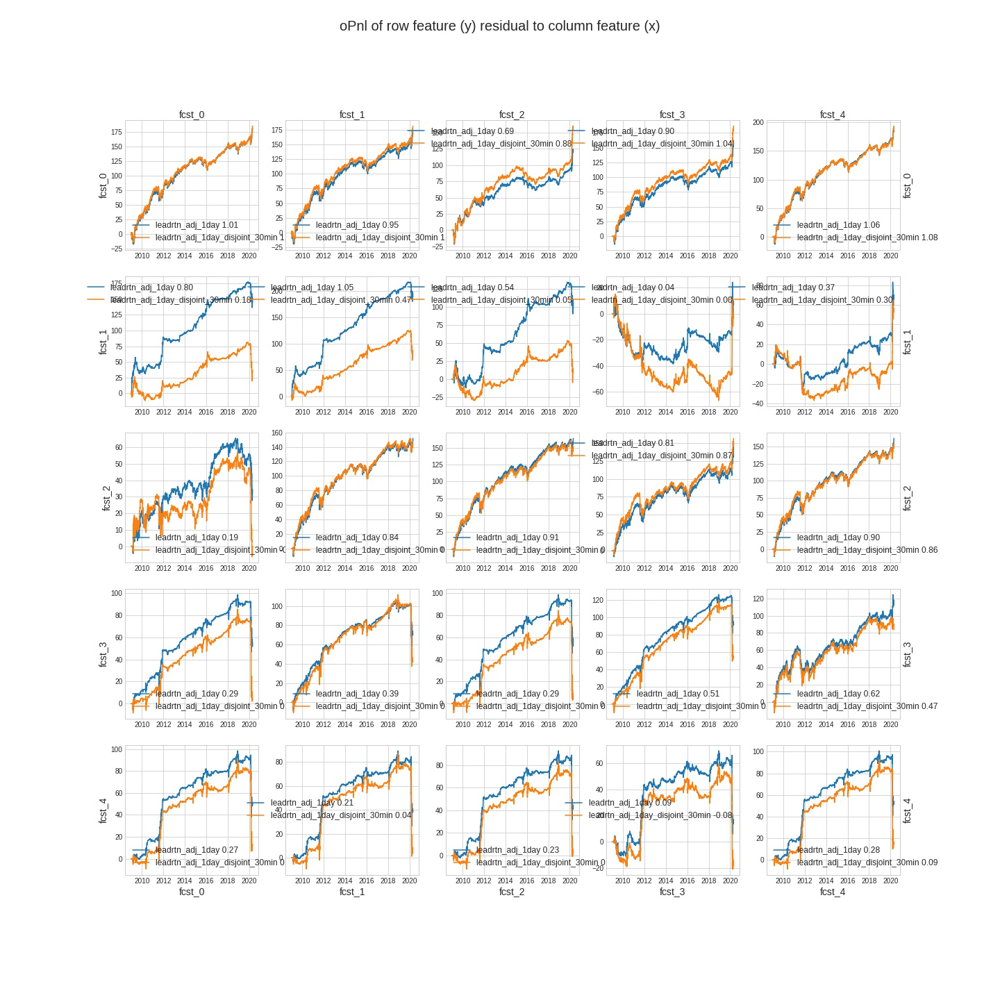

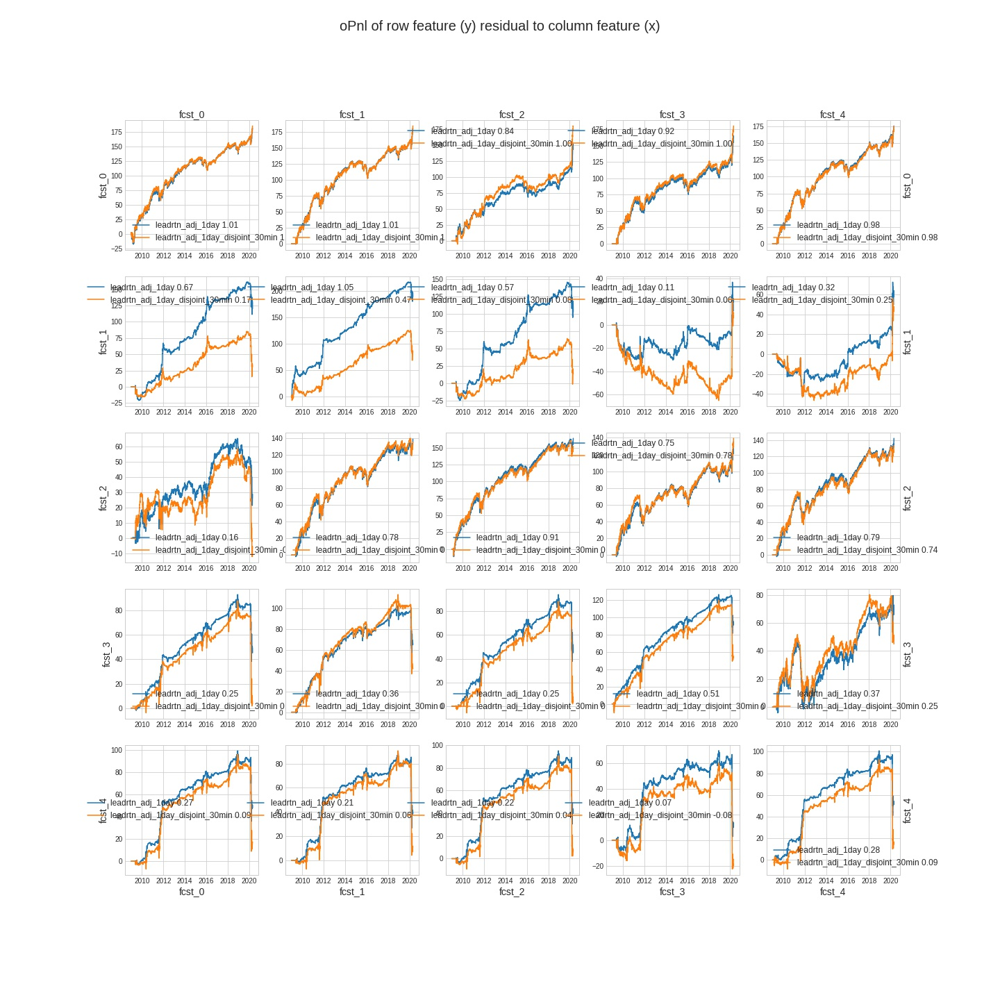

In [15]:
# Colossus_f903007e3
############################################################################
BASELINE_NAME = 'Colossus_f903007e3'
PREV_BASELINE = 'Colossus_bbcb7cb58'
BASELINE_NOTES = 'bilinear centauri with tech features, larger minibatch and num_its=4'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        # + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(        
        end_to_end=False, minibatch=60, batch_size=3000, burn_in=(2,3000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=4,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)


# --- build up the corpii with feature subsets ---
# # create centauri's with different feature subset selectors at the head
# build feature subset transformers
centauri_proto = mx.HPSet( 
    type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20,
    transformer = [ 
        mx.HPSet( type='wins', quantiles=0.05 ),  
        mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
    hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
)
if True:
    phps.colossus.corpii.insert( 0, centauri_proto )
else:
    mx.online = mx.online.reload()
    feature_subsets, counts = mx.online.OnlineSubset.build( num_features=len( phps.features ), num_subsets=6, features_per_subset=len( phps.features )//3, seed=8 )
    for fi, fs in enumerate( feature_subsets ):
        centauri = centauri_proto.clone( )
        centauri.transformer = [fs.spec] + [tf.clone() for tf in centauri.transformer]
        phps.colossus.corpii.insert( 0, centauri )

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_036c4c8e
## bilinear centauri with tech features, random minibatch (30) and num_its=1 (follows Colossus_f903007e3) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,-0.871512,0.451299,0.018742,0.000351,23.201456,2.156984,0.691634,0.650715,0.528247
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,-0.871512,0.109555,0.007008,0.000049,8.661888,1.030668,0.691634,0.650715,0.528247


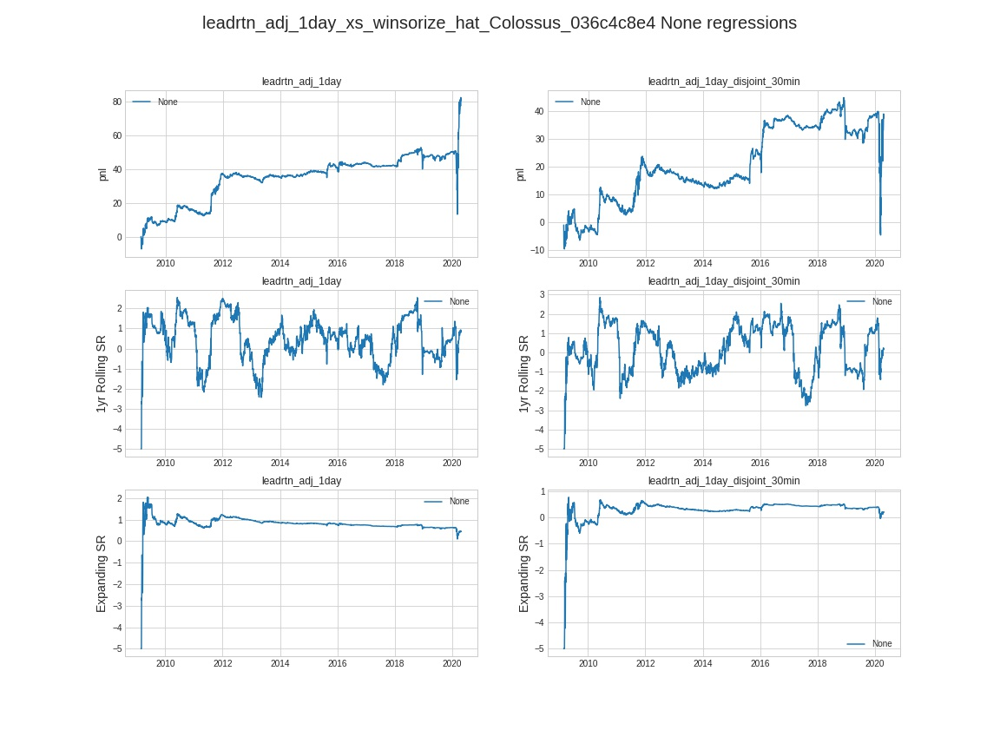

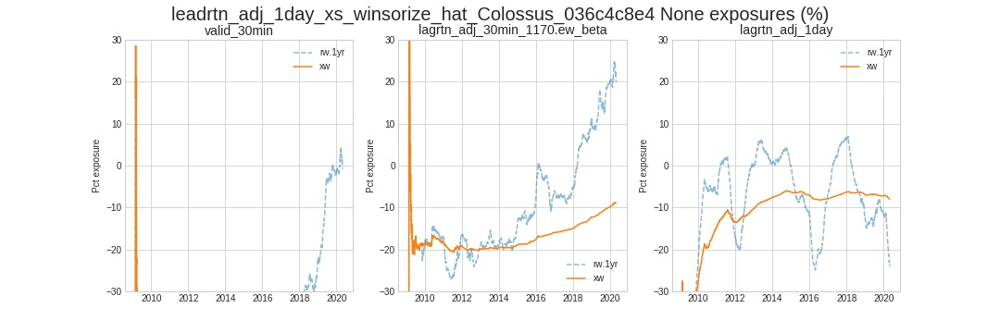

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_215a08b77,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_8d02157d6,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_bbcb7cb58,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_f903007e3,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_036c4c8e4,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.225656,0.549596,0.393636,0.408644
fcst_1,0.225656,1.000000,0.425463,0.134979,0.275826
fcst_2,0.549596,0.425463,1.000000,0.623206,0.600759
fcst_3,0.393636,0.134979,0.623206,1.000000,0.346744
fcst_4,0.408644,0.275826,0.600759,0.346744,1.000000


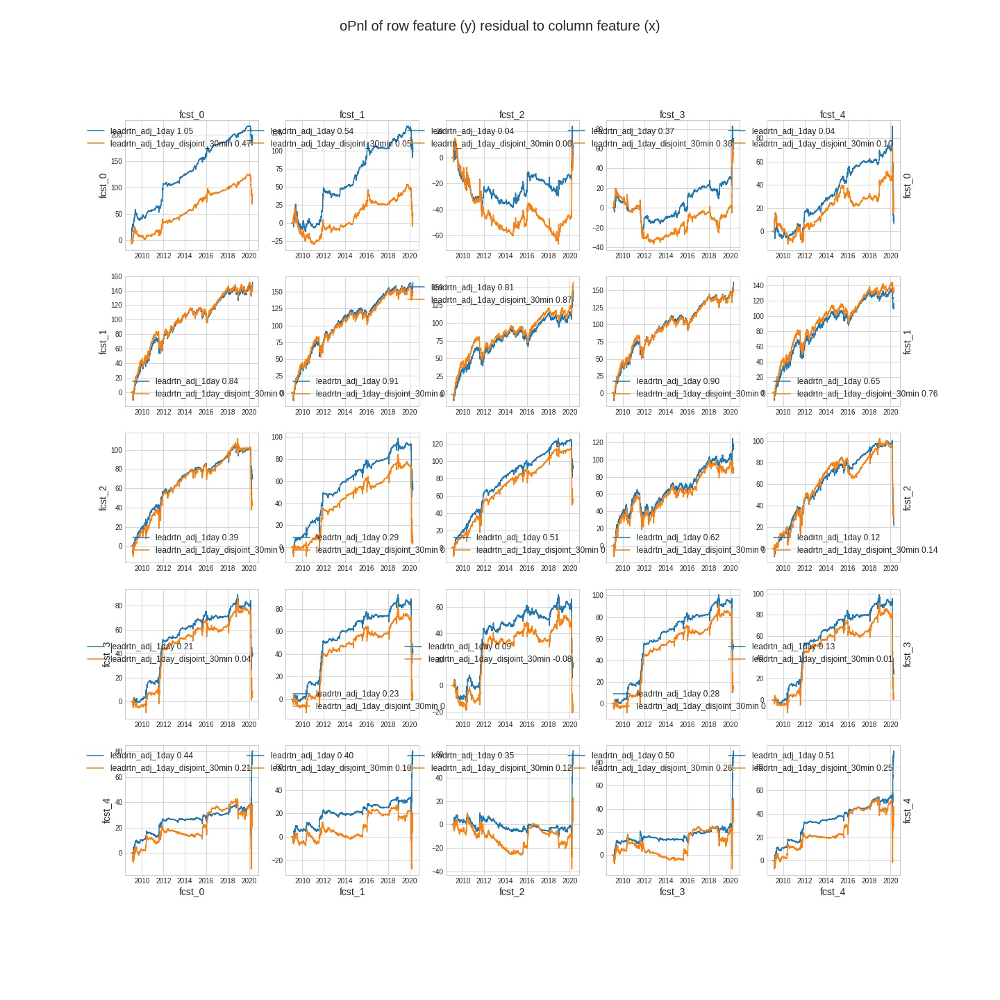

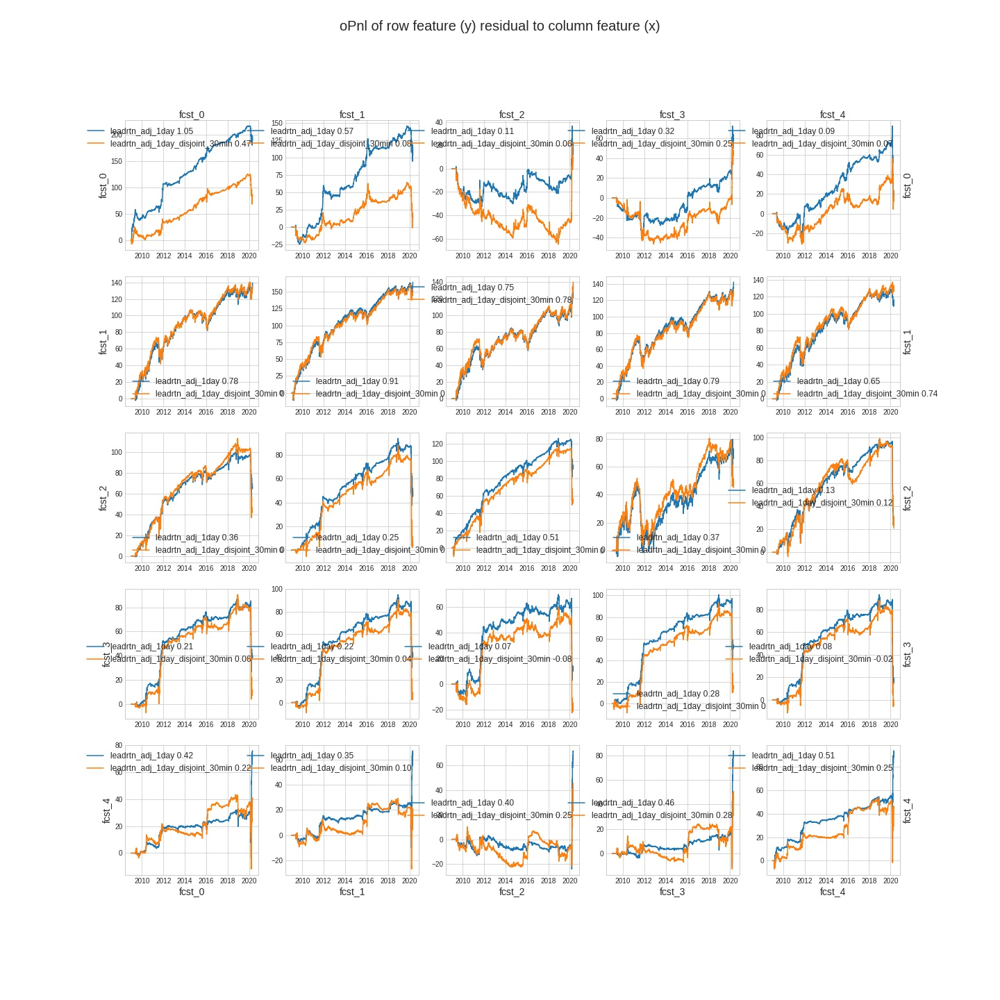

In [8]:
# Colossus_036c4c8e
############################################################################
BASELINE_NAME = 'Colossus_036c4c8e'
PREV_BASELINE = 'Colossus_f903007e3'
BASELINE_NOTES = 'bilinear centauri with tech features, random minibatch (30) and num_its=1'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        # + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(2,3000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)


# --- build up the corpii with feature subsets ---
# # create centauri's with different feature subset selectors at the head
# build feature subset transformers
centauri_proto = mx.HPSet( 
    type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20,
    transformer = [ 
        mx.HPSet( type='wins', quantiles=0.05 ),  
        mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
    hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
)
if True:
    phps.colossus.corpii.insert( 0, centauri_proto )
else:
    mx.online = mx.online.reload()
    feature_subsets, counts = mx.online.OnlineSubset.build( num_features=len( phps.features ), num_subsets=6, features_per_subset=len( phps.features )//3, seed=8 )
    for fi, fs in enumerate( feature_subsets ):
        centauri = centauri_proto.clone( )
        centauri.transformer = [fs.spec] + [tf.clone() for tf in centauri.transformer]
        phps.colossus.corpii.insert( 0, centauri )

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_036c4c8e4
## bilinear centauri with tech features, continguous minibatch (30) and num_its=1 (follows Colossus_036c4c8e)

""


,name,type,shape,numel,norm,dtype,device,arguments
0,,Colossus,,32491,1.963028e-06,,,"{'corpii': [CentauriCorpus( act=None, r..."
1,corpii/,ModuleList,,32491,1.963028e-06,,,{'modules': <bound method Module.modules of Mo...
2,corpii/0/,CentauriCorpus,,32491,1.963028e-06,,,"{'act': None, 'ridge': 1e-07, 'ar': 10, 'ma': ..."
3,corpii/0/β,Parameter,"(1, 57, 57, 10)",32490,1.958577e-06,torch.float64,cuda:0,
4,corpii/0/bias,Parameter,"(1,)",1,4.450677e-09,torch.float64,cuda:0,
5,corpii/0/transformer/,OnlineSequential,,0,0.000000e+00,,,{'args': <class 'inspect._empty'>}
6,corpii/0/transformer/_module_list/,ModuleList,,0,0.000000e+00,,,{'modules': <bound method Module.modules of Mo...
7,corpii/0/transformer/_module_list/0/,OnlineWinsorize,,0,0.000000e+00,,,{'quantiles': 0.05}
8,corpii/0/transformer/_module_list/0/_wins/,Winsorize,,0,0.000000e+00,,,"{'quantiles': [0.05, 0.95], 'dim': 0}"
9,corpii/0/transformer/_module_list/1/,OnlineNorm,,0,0.000000e+00,,,"{'demean': True, 'normalize': True, 'clip': 3,..."


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,0.0638,1.532055,0.020772,0.000431,25.729910,2.075032,0.929935,0.91337,0.7402
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,0.0638,1.344982,0.012035,0.000145,14.889794,0.974844,0.929935,0.91337,0.7402


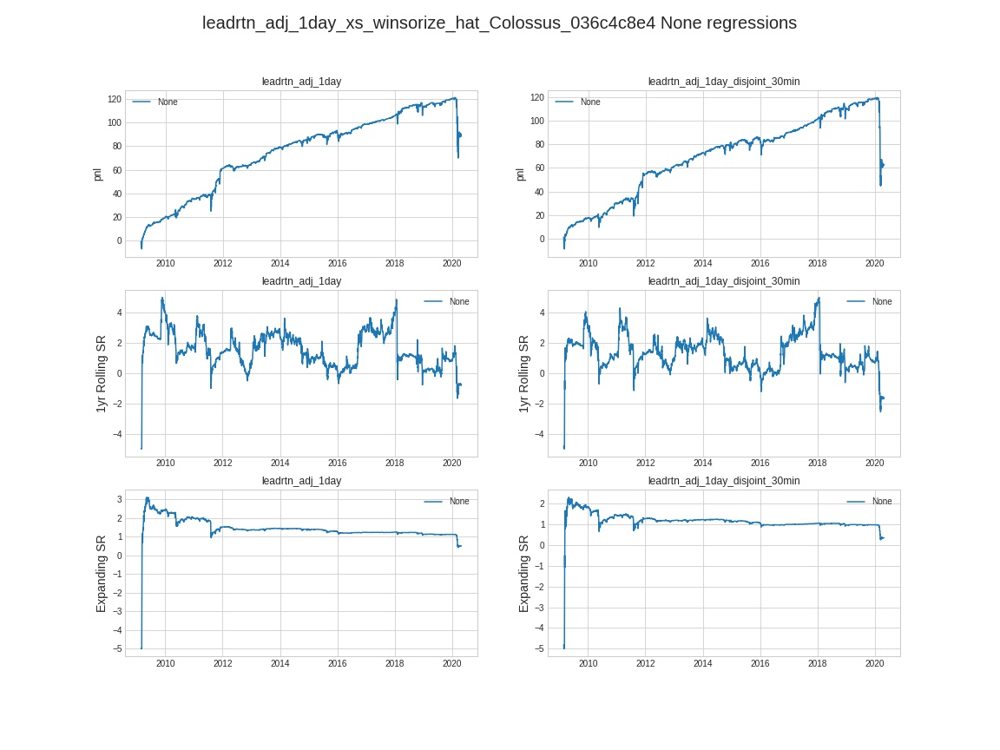

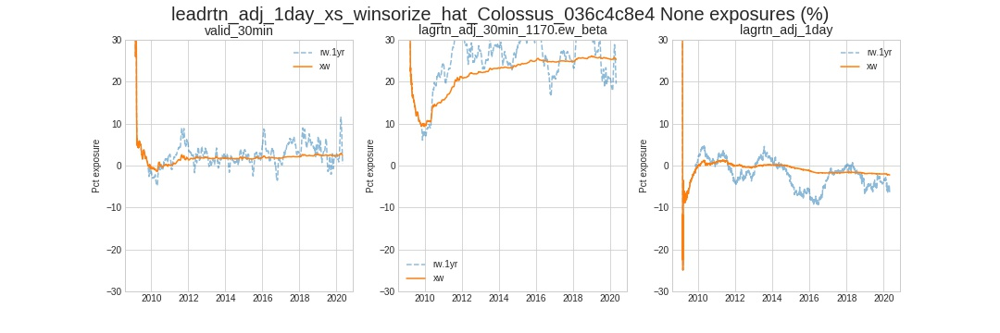

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_8d02157d6,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_bbcb7cb58,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_f903007e3,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_036c4c8e4,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_4
fcst_0,1.000000,0.425463,0.134979,0.275832
fcst_1,0.425463,1.000000,0.623206,0.600774
fcst_2,0.134979,0.623206,1.000000,0.346755
fcst_4,0.275832,0.600774,0.346755,1.000000


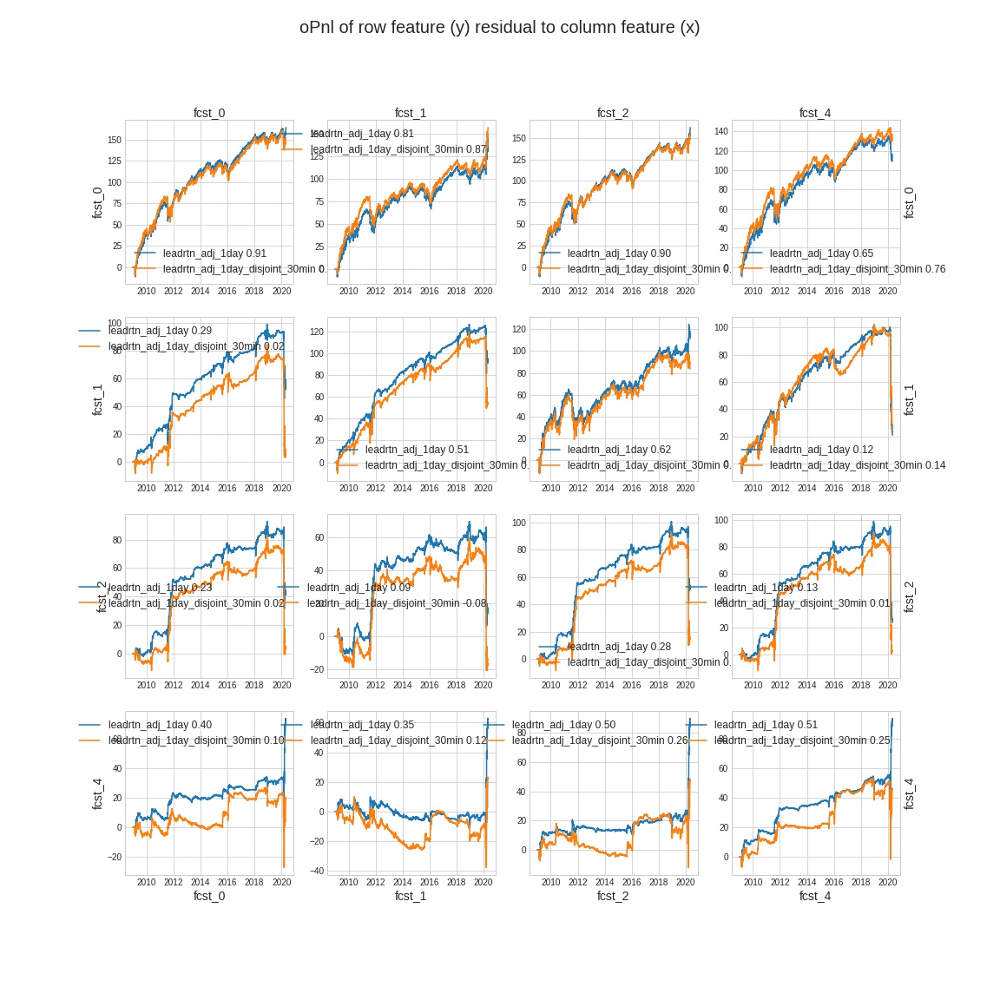

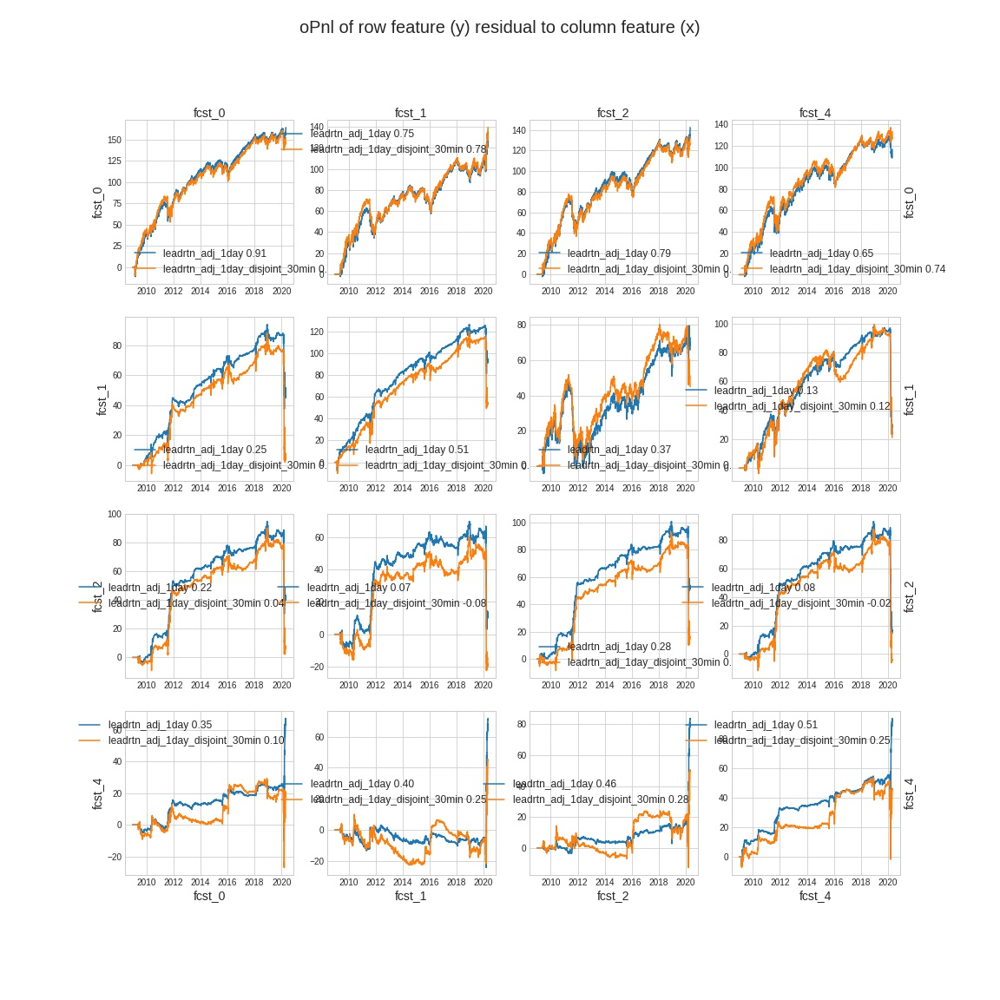

In [16]:
# Colossus_036c4c8e4
############################################################################
BASELINE_NAME = None #'Colossus_036c4c8e4'
PREV_BASELINE = 'Colossus_036c4c8e'
BASELINE_NOTES = 'bilinear centauri with tech features, continguous minibatch (30) and num_its=1'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        # + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
    colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(2,3000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)


# --- build up the corpii with feature subsets ---
# # create centauri's with different feature subset selectors at the head
# build feature subset transformers
centauri_proto = mx.HPSet( 
    type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20,
    transformer = [ 
        mx.HPSet( type='wins', quantiles=0.05 ),  
        mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
    hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
)
if True:
    phps.colossus.corpii.insert( 0, centauri_proto )
else:
    mx.online = mx.online.reload()
    feature_subsets, counts = mx.online.OnlineSubset.build( num_features=len( phps.features ), num_subsets=6, features_per_subset=len( phps.features )//3, seed=8 )
    for fi, fs in enumerate( feature_subsets ):
        centauri = centauri_proto.clone( )
        centauri.transformer = [fs.spec] + [tf.clone() for tf in centauri.transformer]
        phps.colossus.corpii.insert( 0, centauri )

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



#  Colossus_0340843c2
## bilinear centauri with pca features  (follows Colossus_036c4c8e) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,0.072939,1.750265,0.026798,0.000718,33.197212,2.426528,0.907981,0.888078,0.681765
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,0.072939,1.500211,0.016024,0.000257,19.844614,1.204502,0.907981,0.888078,0.681765


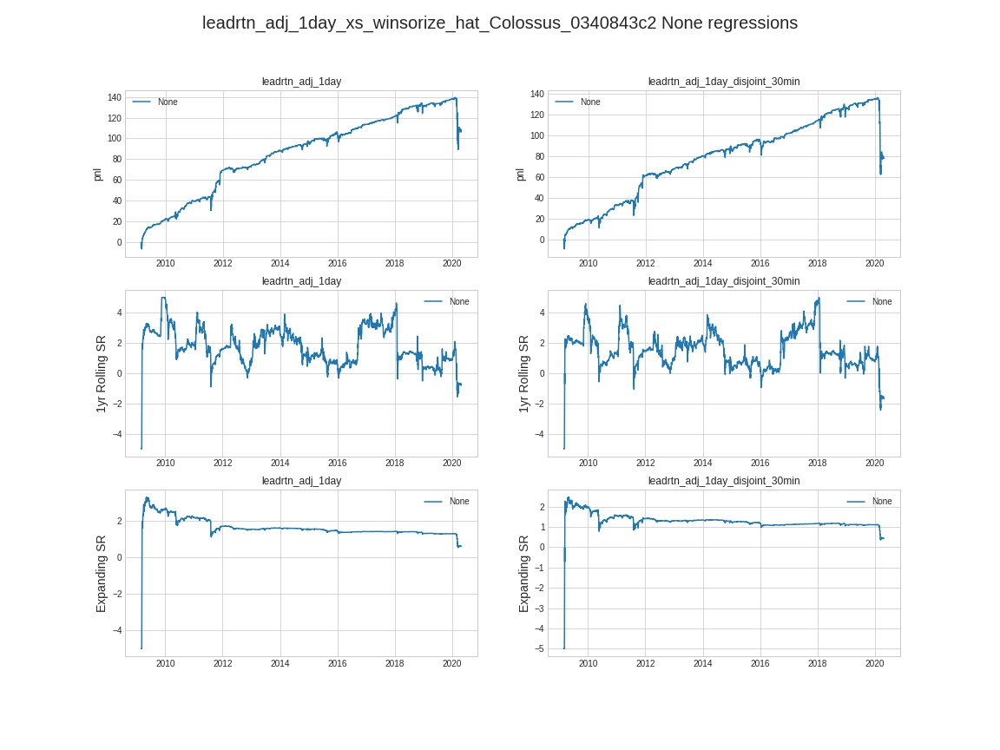

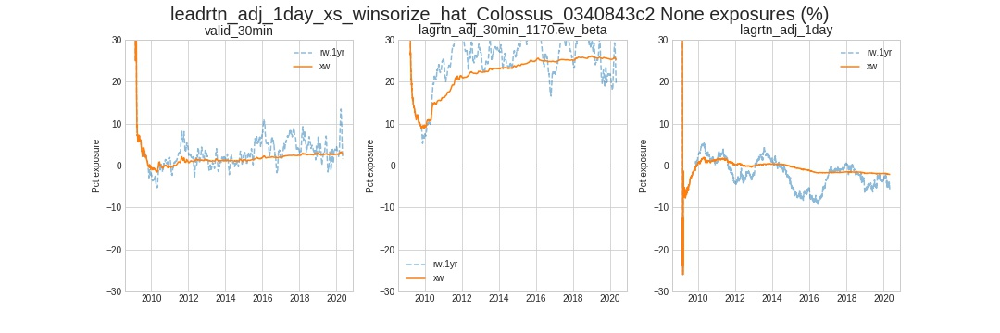

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_8d02157d6,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_bbcb7cb58,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_f903007e3,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_036c4c8e4,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0340843c2,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.425463,0.134979,0.275832,0.471976
fcst_1,0.425463,1.000000,0.623206,0.600774,0.933670
fcst_2,0.134979,0.623206,1.000000,0.346755,0.617170
fcst_3,0.275832,0.600774,0.346755,1.000000,0.623187
fcst_4,0.471976,0.933670,0.617170,0.623187,1.000000


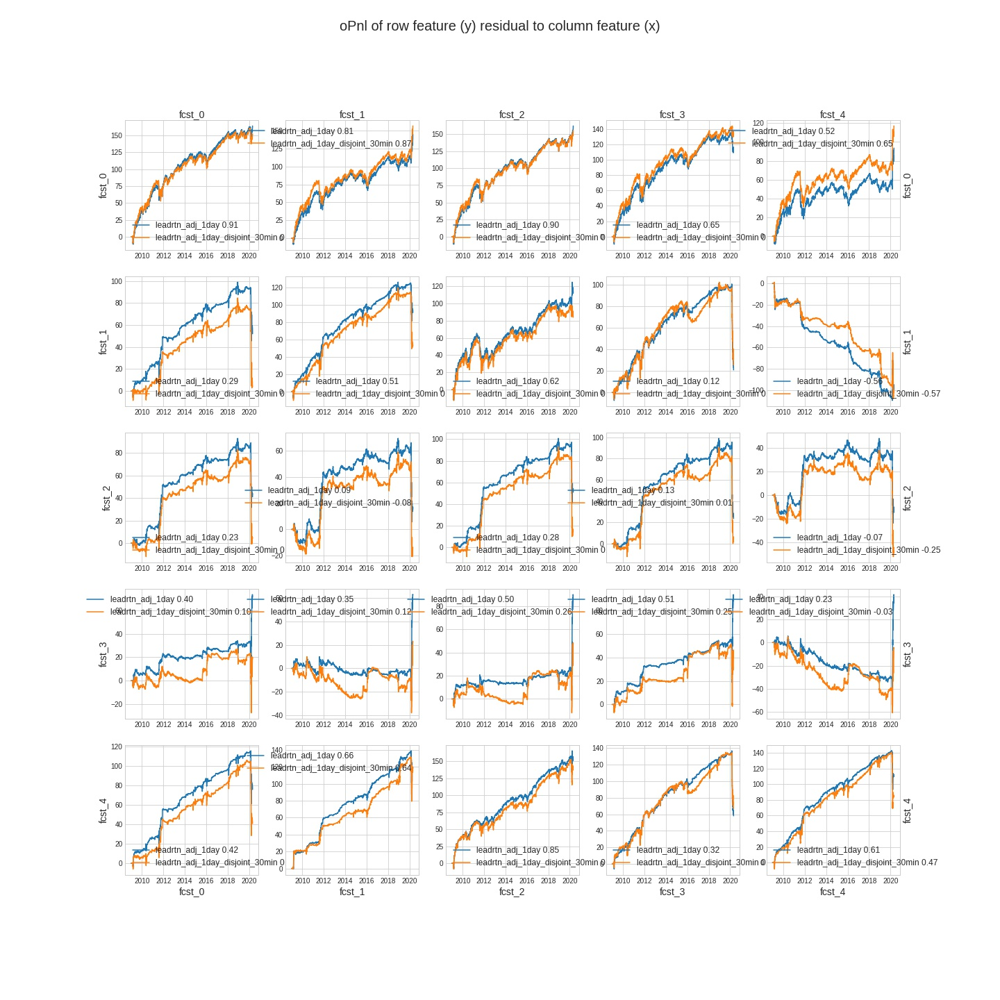

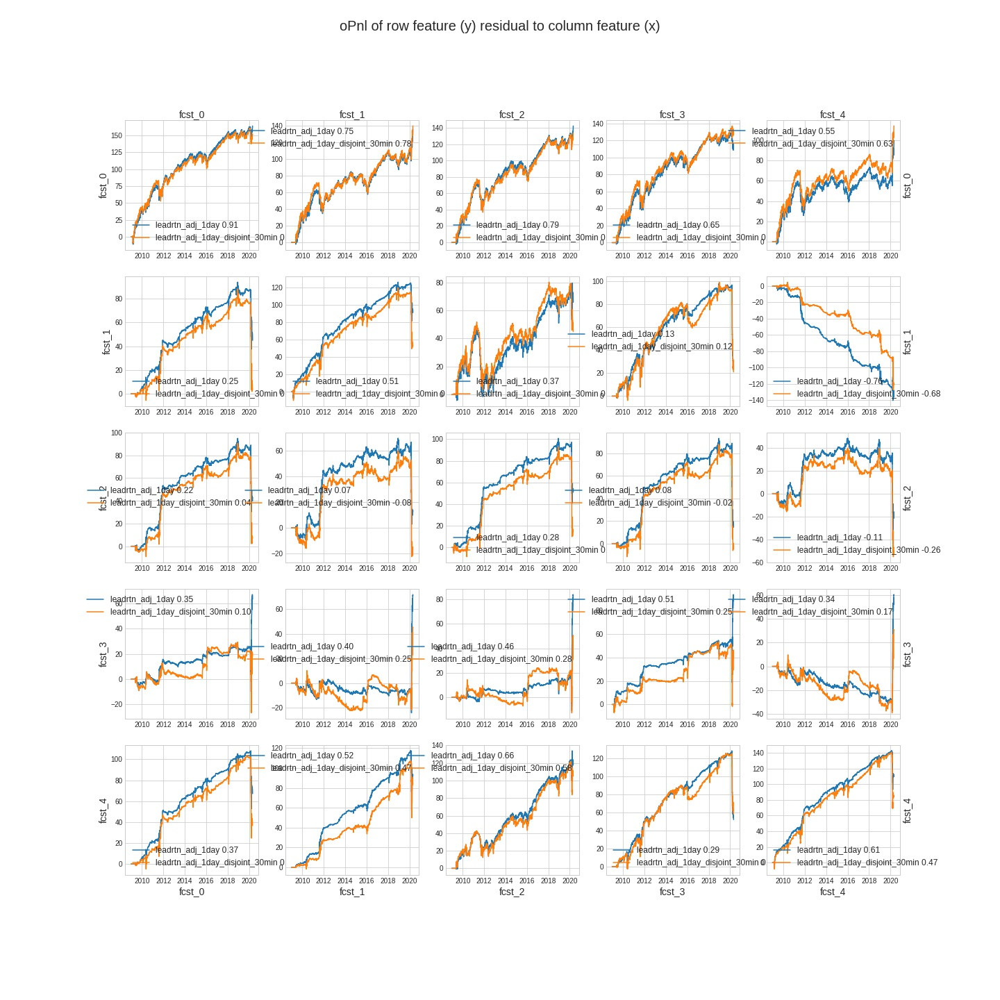

In [22]:
# Colossus_0340843c2
############################################################################
BASELINE_NAME = 'Colossus_0340843c2'
PREV_BASELINE =  'Colossus_036c4c8e'
BASELINE_NOTES = 'bilinear centauri with pca features '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,3000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)


# --- build up the corpii with feature subsets ---
# # create centauri's with different feature subset selectors at the head
# build feature subset transformers
centauri_proto = mx.HPSet( 
    type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20,
    transformer = [ 
        mx.HPSet( type='wins', quantiles=0.05 ),  
        mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
    hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
)
if True:
    phps.colossus.corpii.insert( 0, centauri_proto )
else:
    mx.online = mx.online.reload()
    feature_subsets, counts = mx.online.OnlineSubset.build( num_features=len( phps.features ), num_subsets=6, features_per_subset=len( phps.features )//3, seed=8 )
    for fi, fs in enumerate( feature_subsets ):
        centauri = centauri_proto.clone( )
        centauri.transformer = [fs.spec] + [tf.clone() for tf in centauri.transformer]
        phps.colossus.corpii.insert( 0, centauri )

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_3c3fe09f4
## bilinear centauri with pca features, H=5  (follows Colossus_0340843c2) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,9.923009,1.168770,0.031272,0.000978,38.757786,2.873288,0.882415,0.868669,0.686534
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,9.923009,1.172296,0.027025,0.000730,33.471760,2.216161,0.882415,0.868669,0.686534


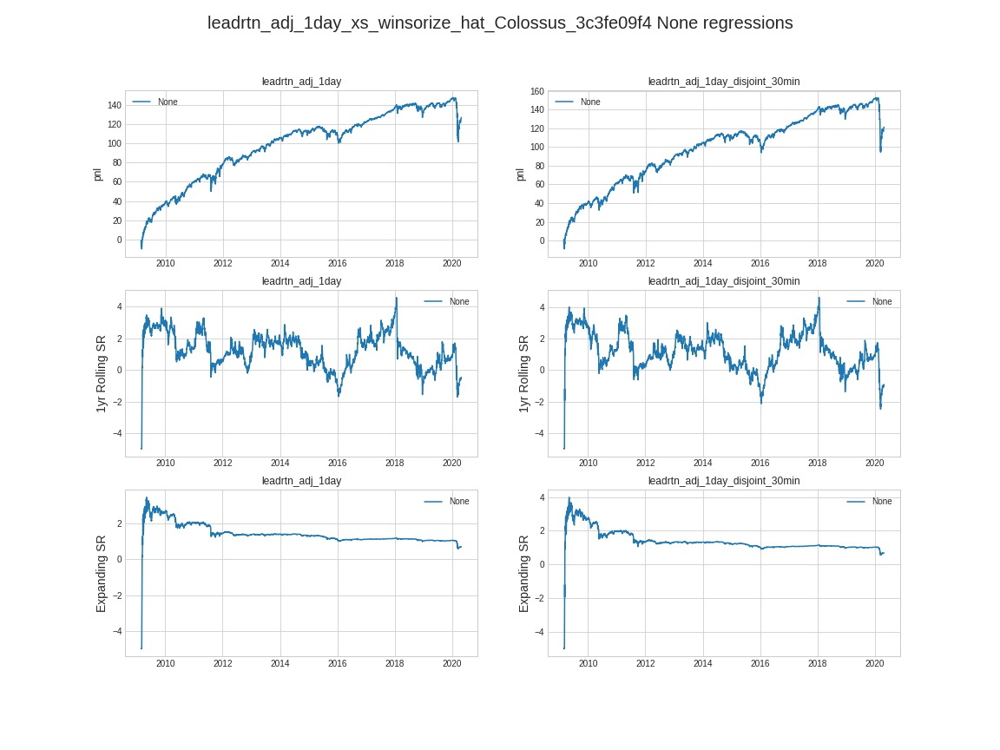

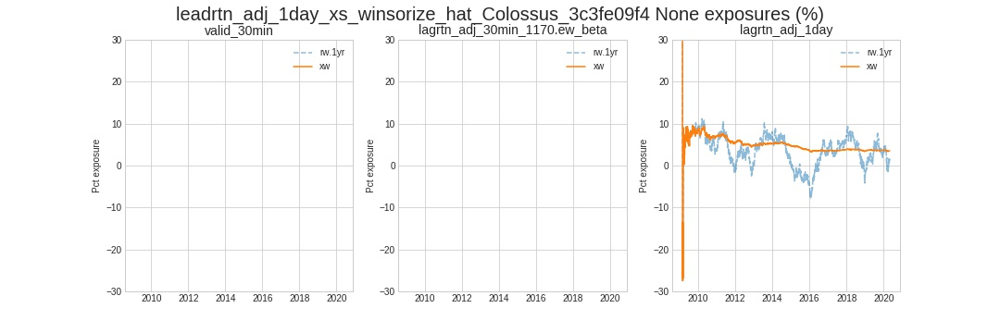

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_bbcb7cb58,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_f903007e3,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_036c4c8e4,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0340843c2,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_3c3fe09f4,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.623206,0.600774,0.933733,0.509705
fcst_1,0.623206,1.000000,0.346755,0.617179,0.218533
fcst_2,0.600774,0.346755,1.000000,0.623186,0.389652
fcst_3,0.933733,0.617179,0.623186,1.000000,0.567384
fcst_4,0.509705,0.218533,0.389652,0.567384,1.000000


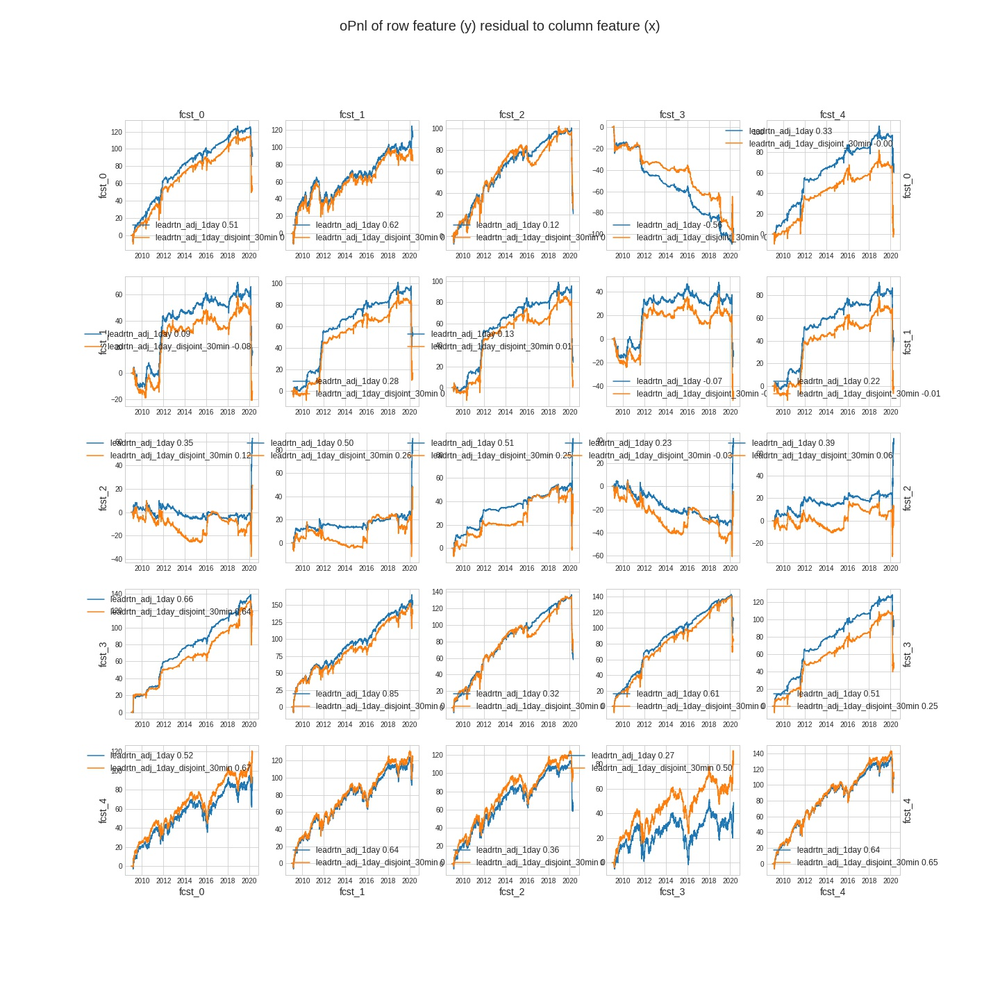

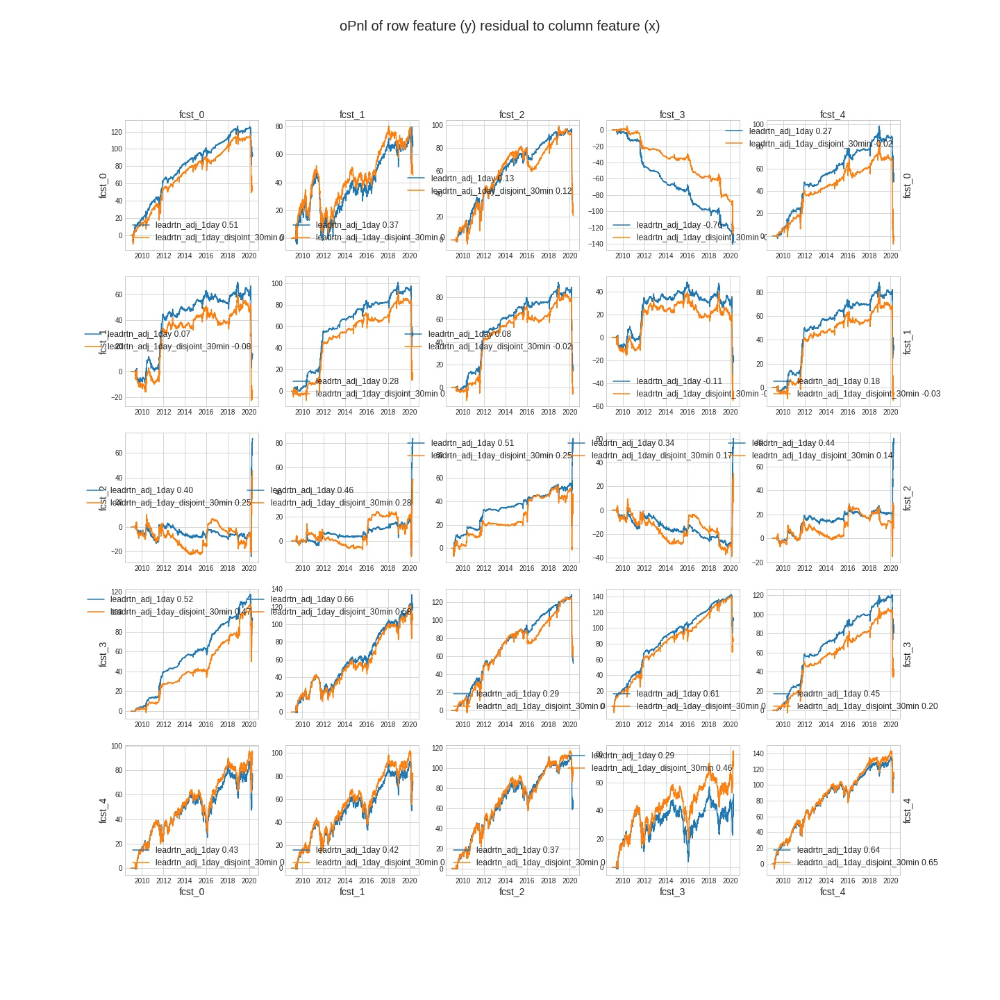

In [28]:
# Colossus_3c3fe09f4
############################################################################
BASELINE_NAME = 'Colossus_3c3fe09f4'
PREV_BASELINE =  'Colossus_0340843c2'
BASELINE_NOTES = 'bilinear centauri with pca features, H=5 '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(4,2000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)


# --- build up the corpii with feature subsets ---
# # create centauri's with different feature subset selectors at the head
# build feature subset transformers
centauri_proto = mx.HPSet( 
    type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=5, dropout=0.33, K=20,
    transformer = [ 
        mx.HPSet( type='wins', quantiles=0.05 ),  
        mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
    hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
)
if True:
    phps.colossus.corpii.insert( 0, centauri_proto )
else:
    mx.online = mx.online.reload()
    feature_subsets, counts = mx.online.OnlineSubset.build( num_features=len( phps.features ), num_subsets=6, features_per_subset=len( phps.features )//3, seed=8 )
    for fi, fs in enumerate( feature_subsets ):
        centauri = centauri_proto.clone( )
        centauri.transformer = [fs.spec] + [tf.clone() for tf in centauri.transformer]
        phps.colossus.corpii.insert( 0, centauri )

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



,num_calls,duration_total,duration_mean,duration_squared,duration_std
concating,2,0.009289,0.003096,0.000029,0.004378
converting,2,0.005564,0.001855,0.000005,0.001315


,name,type,shape,numel,norm,dtype,device,arguments
0,,Colossus,,53307,5.489146e-01,,,"{'corpii': [CentauriCorpus( act=None, r..."
1,corpii/,ModuleList,,53307,5.489146e-01,,,{'modules': <bound method Module.modules of Mo...
2,corpii/0/,CentauriCorpus,,53291,1.410784e-06,,,"{'act': None, 'ridge': 1e-07, 'ar': 10, 'ma': ..."
3,corpii/0/β,Parameter,"(1, 73, 73, 10)",53290,1.410515e-06,torch.float64,cuda:0,
4,corpii/0/bias,Parameter,"(1,)",1,2.690976e-10,torch.float64,cuda:0,
5,corpii/0/transformer/,OnlineSequential,,0,0.000000e+00,,,{'args': <class 'inspect._empty'>}
6,corpii/0/transformer/_module_list/,ModuleList,,0,0.000000e+00,,,{'modules': <bound method Module.modules of Mo...
7,corpii/0/transformer/_module_list/0/,OnlineWinsorize,,0,0.000000e+00,,,{'quantiles': 0.05}
8,corpii/0/transformer/_module_list/0/_wins/,Winsorize,,0,0.000000e+00,,,"{'quantiles': [0.05, 0.95], 'dim': 0}"
9,corpii/0/transformer/_module_list/1/,OnlineNorm,,0,0.000000e+00,,,"{'demean': True, 'normalize': True, 'clip': 3,..."


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,0.031333,1.680831,0.017277,0.000299,21.388529,2.577515,0.964204,0.956075,0.878914
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,0.031333,1.466850,0.010569,0.000112,13.065340,1.362554,0.964204,0.956075,0.878914


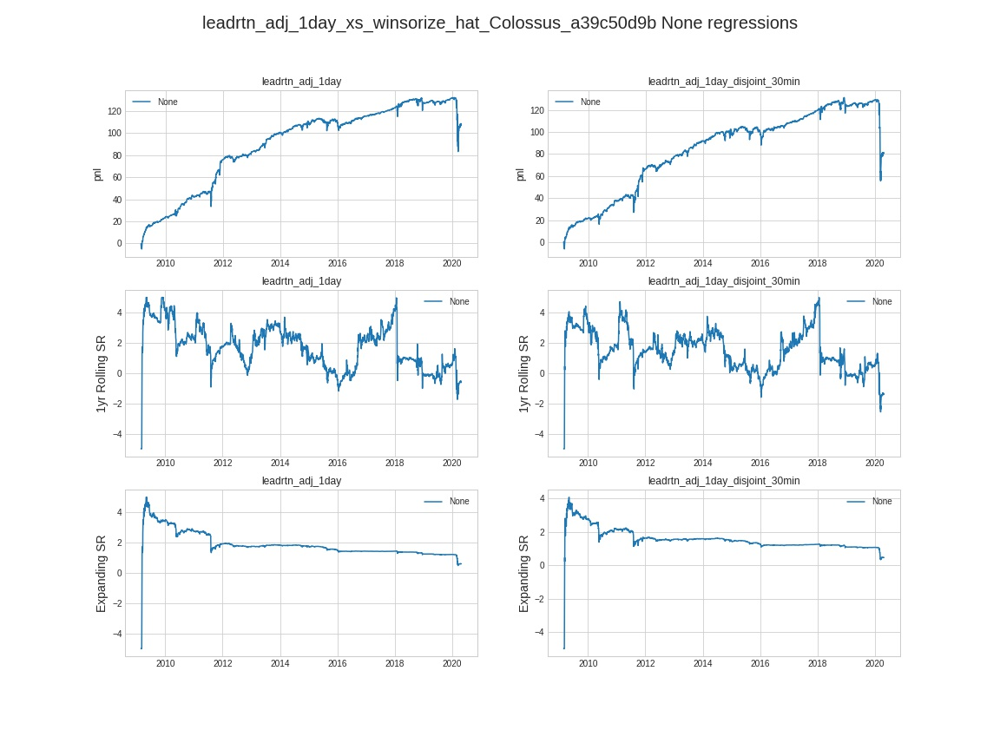

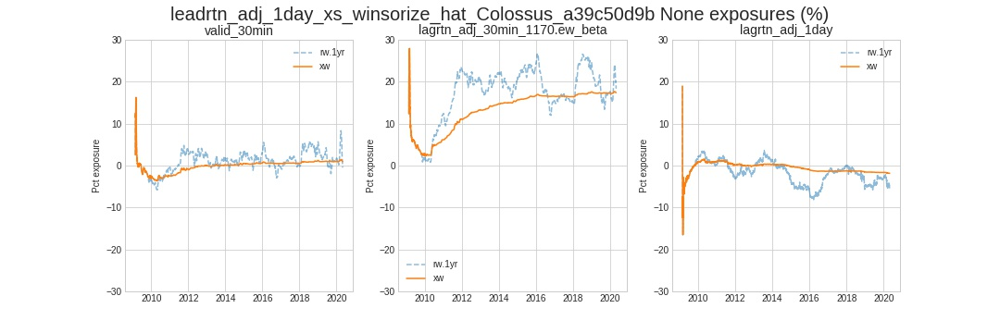

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_f903007e3,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_036c4c8e4,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0340843c2,fcst_2
leadrtn_adj_1day_xs_winsorize_hat_Colossus_3c3fe09f4,fcst_3
leadrtn_adj_1day_xs_winsorize_hat_Colossus_a39c50d9b,fcst_4


,fcst_0,fcst_1,fcst_2,fcst_3,fcst_4
fcst_0,1.000000,0.346755,0.617179,0.218519,0.454517
fcst_1,0.346755,1.000000,0.623186,0.389629,0.664878
fcst_2,0.617179,0.623186,1.000000,0.567349,0.873025
fcst_3,0.218519,0.389629,0.567349,1.000000,0.548401
fcst_4,0.454517,0.664878,0.873025,0.548401,1.000000


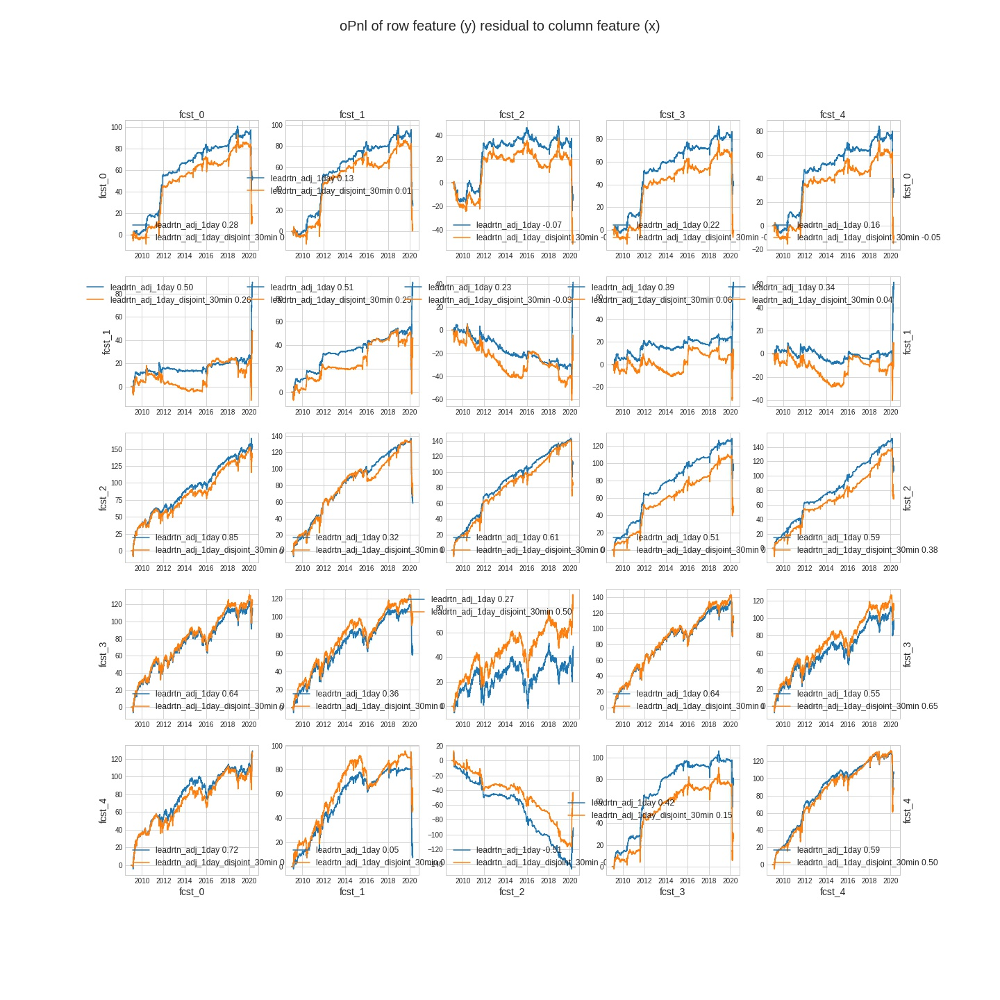

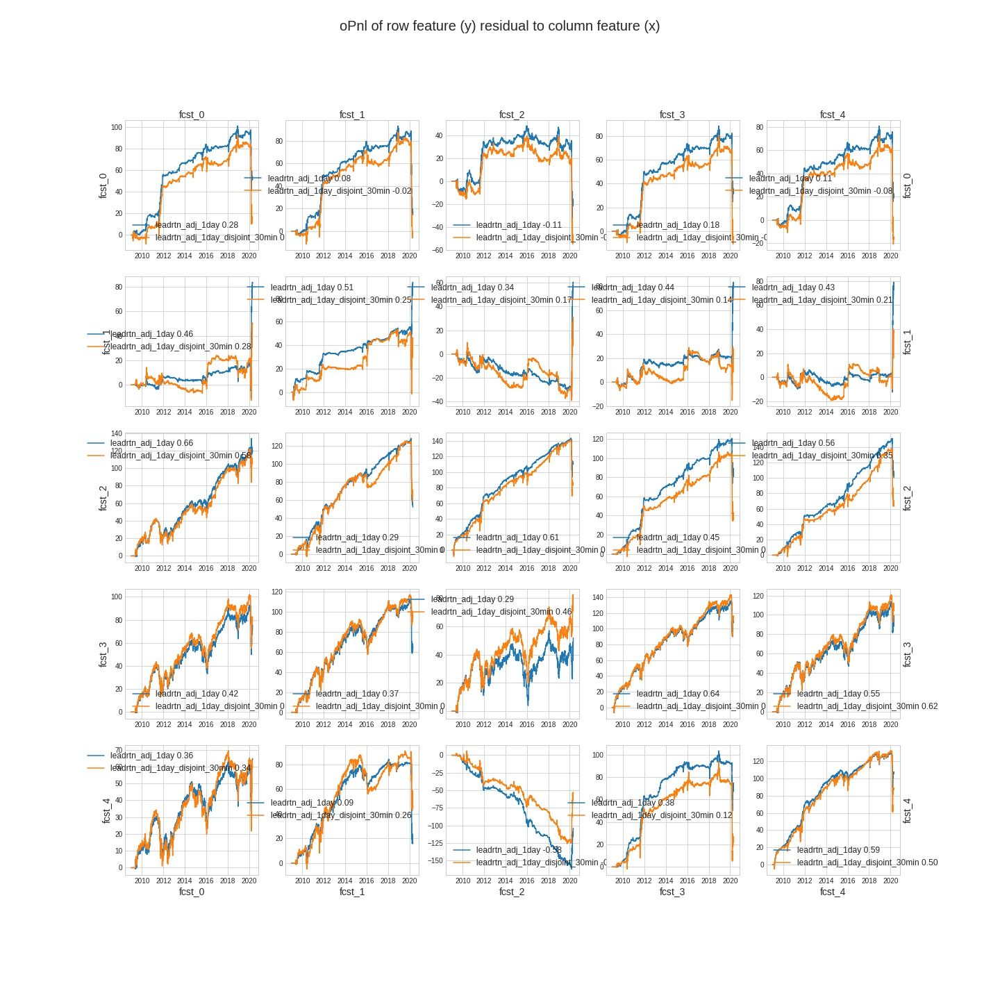

In [27]:
# bilinear centauri with pca features, H=1, hydra (no Γ and Ω), cumsum ensembling
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_3c3fe09f4'
BASELINE_NOTES = 'bilinear centauri with pca features, H=1, hydra (no Γ and Ω)'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(2,2000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1, priming=200,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode='cumsum',  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20, priming=300,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='hydra', lr=1e-3, ridge=1e-5, use_bias=True, priming=1000,
                transformer = [ 
                    mx.HPSet( type='norm', halflife=None, clip=None, demean=False, normalize=True ), 
                ],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        bas
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



,num_calls,duration_total,duration_mean,duration_squared,duration_std
concating,2,0.006782,0.002261,0.000015,0.003197
converting,2,0.005728,0.001909,0.000006,0.001367


,name,type,shape,numel,norm,dtype,device,arguments
0,,Colossus,,53309,1.570692e+00,,,"{'corpii': [CentauriCorpus( act=None, r..."
1,corpii/,ModuleList,,53307,5.706917e-01,,,{'modules': <bound method Module.modules of Mo...
2,corpii/0/,CentauriCorpus,,53291,1.410784e-06,,,"{'act': None, 'ridge': 1e-07, 'ar': 10, 'ma': ..."
3,corpii/0/β,Parameter,"(1, 73, 73, 10)",53290,1.410515e-06,torch.float64,cuda:0,
4,corpii/0/bias,Parameter,"(1,)",1,2.690976e-10,torch.float64,cuda:0,
5,corpii/0/transformer/,OnlineSequential,,0,0.000000e+00,,,{'args': <class 'inspect._empty'>}
6,corpii/0/transformer/_module_list/,ModuleList,,0,0.000000e+00,,,{'modules': <bound method Module.modules of Mo...
7,corpii/0/transformer/_module_list/0/,OnlineWinsorize,,0,0.000000e+00,,,{'quantiles': 0.05}
8,corpii/0/transformer/_module_list/0/_wins/,Winsorize,,0,0.000000e+00,,,"{'quantiles': [0.05, 0.95], 'dim': 0}"
9,corpii/0/transformer/_module_list/1/,OnlineNorm,,0,0.000000e+00,,,"{'demean': True, 'normalize': True, 'clip': 3,..."


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,0.031397,1.680793,0.017281,0.000299,21.389668,2.577629,0.964207,0.956077,0.878925
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,0.031397,1.466835,0.010563,0.000112,13.066332,1.362640,0.964207,0.956077,0.878925


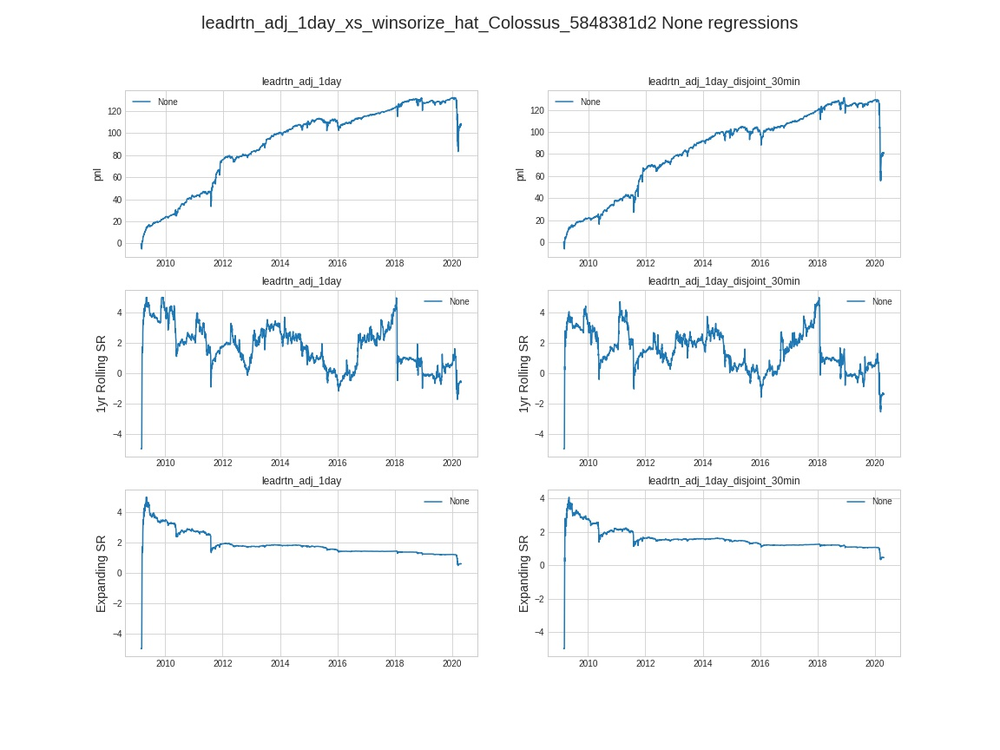

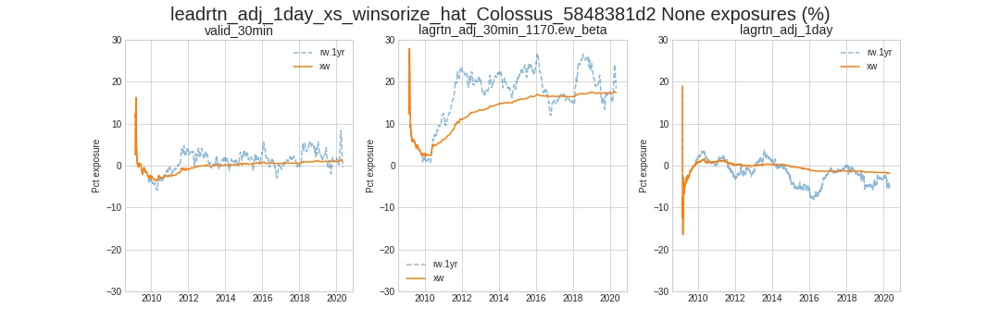

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_5848381d2,fcst_0


,fcst_0
fcst_0,1.0


,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.977479,0.972371


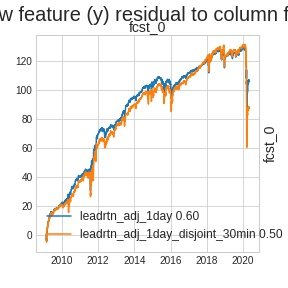

,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.977479,0.972371


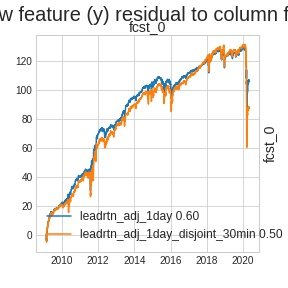

In [31]:
# bilinear centauri with pca features, H=1, hydra (no Γ and Ω), simplex ensembling
############################################################################
BASELINE_NAME = None
PREV_BASELINE = None
BASELINE_NOTES = 'bilinear centauri with pca features, H=1, hydra (no Γ and Ω)'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(2,2000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1, priming=200,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode='simplex',  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20, priming=300,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='hydra', lr=1e-5, ridge=1e-5, use_bias=True, priming=1500,
                transformer = [ 
                    mx.HPSet( type='norm', halflife=None, clip=None, demean=False, normalize=True ), 
                ],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        bas
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



,num_calls,duration_total,duration_mean,duration_squared,duration_std
concating,2,0.006364,0.002121,0.000013,0.00300
converting,2,0.004966,0.001655,0.000004,0.00117


,name,type,shape,numel,norm,dtype,device,arguments
0,,Colossus,,638537,3.632559e-01,,,"{'corpii': [CentauriCorpus( act=None, r..."
1,corpii/,ModuleList,,638527,3.102697e-05,,,{'modules': <bound method Module.modules of Mo...
2,corpii/0/,CentauriCorpus,,638451,6.802543e-07,,,"{'act': None, 'ridge': 1e-07, 'ar': 10, 'ma': ..."
3,corpii/0/β,Parameter,"(5, 113, 113, 10)",638450,6.722480e-07,torch.float64,cuda:0,
4,corpii/0/bias,Parameter,"(1,)",1,8.006260e-09,torch.float64,cuda:0,
5,corpii/0/transformer/,OnlineSequential,,0,0.000000e+00,,,{'args': <class 'inspect._empty'>}
6,corpii/0/transformer/_module_list/,ModuleList,,0,0.000000e+00,,,{'modules': <bound method Module.modules of Mo...
7,corpii/0/transformer/_module_list/0/,OnlineWinsorize,,0,0.000000e+00,,,{'quantiles': 0.05}
8,corpii/0/transformer/_module_list/0/_wins/,Winsorize,,0,0.000000e+00,,,"{'quantiles': [0.05, 0.95], 'dim': 0}"
9,corpii/0/transformer/_module_list/1/,OnlineNorm,,0,0.000000e+00,,,"{'demean': True, 'normalize': True, 'clip': 3,..."


/home/fj/anaconda3/lib/python3.7/site-packages/xarray/core/computation.py:604: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,0.339803,1.11022,0.016782,0.000282,20.784086,2.300522,0.99341,0.991667,0.980188
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,0.339803,1.12950,0.016119,0.000260,19.972973,2.080938,0.99341,0.991667,0.980188


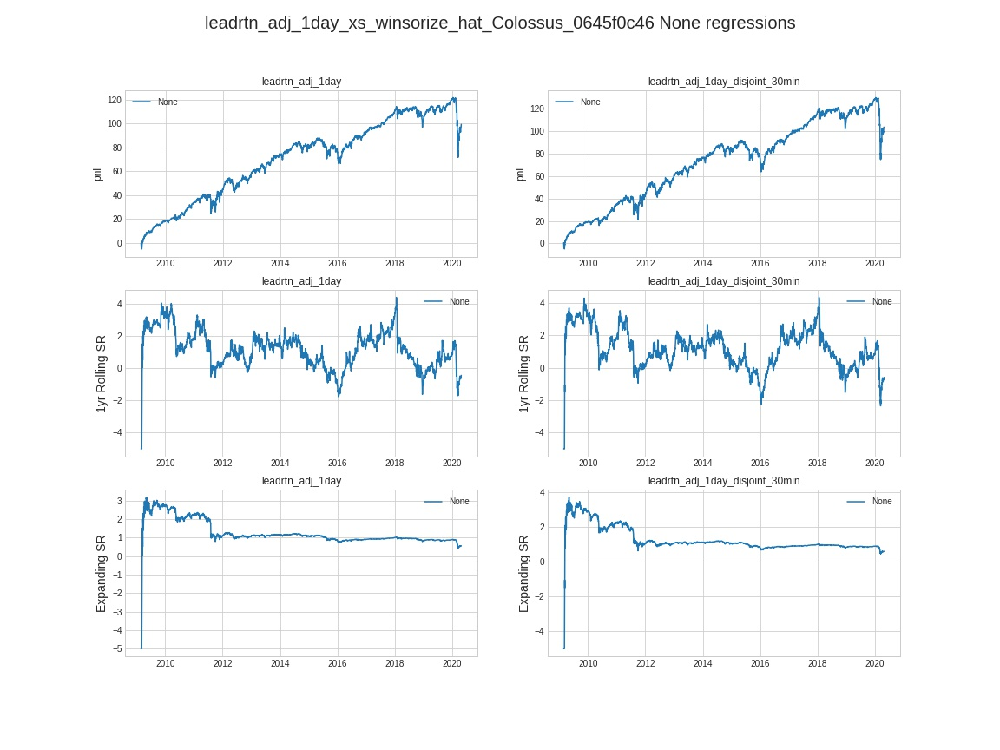

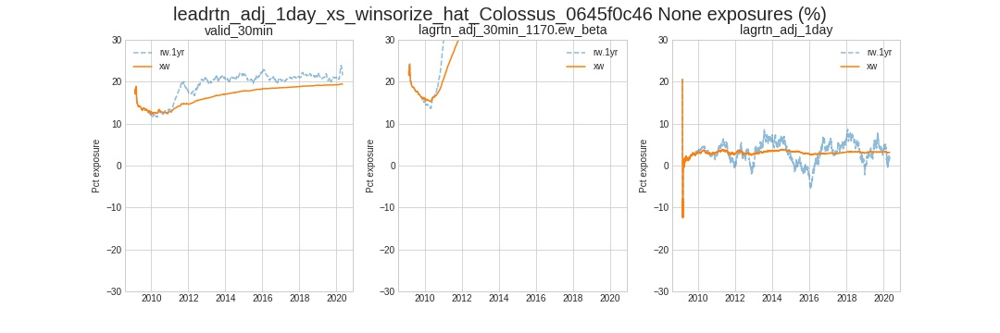

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0645f0c46,fcst_0


,fcst_0
fcst_0,1.0


,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.992322,0.990748


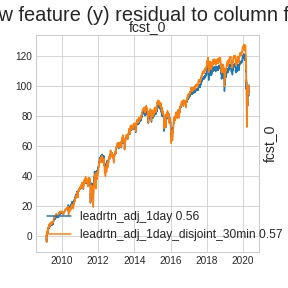

,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.992322,0.990748


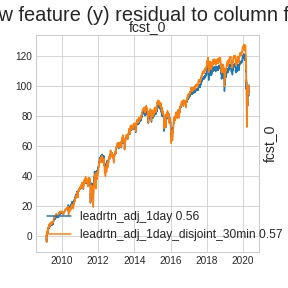

In [6]:
# bilinear centauri with pca features, H=5, hydra (no Γ and Ω), simplex ensembling
############################################################################
BASELINE_NAME = None
PREV_BASELINE = None
BASELINE_NOTES = 'bilinear centauri with pca features, H=1, hydra (no Γ and Ω)'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(2,2000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1, priming=200,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode='simplex',  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=5, dropout=None, K=20, priming=300,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='hydra', lr=1e-5, ridge=1e-5, use_bias=True, priming=1500,
                transformer = [ 
                    mx.HPSet( type='norm', halflife=None, clip=None, demean=False, normalize=True ), 
                ],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=None, ar=None, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='ema', halflifes=[10, 30] ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer=[ 
        #             mx.HPSet( type='wins', quantiles=0.05 ),  
        #             mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #             mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )
        #         ],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ), # polyak=dict( lr=1, decay=0.80, ridge=0, style='softplus' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True,
        #         halflife_polyak=10, 
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='centauri', mode='bilinear', act=None, ma=20, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-7, use_bias=True,
        #         transformer = [ mx.HPSet( type='wins', quantiles=0.05 ),  mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
        #                         mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
        #         hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        bas
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_0b3b5ef07
## linear centauri with pca features, H=5, hydra ,  Γ and Ω, last ensembling (follows Colossus_3c3fe09f4) 

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,1.282493e+07,1.149453,0.020039,0.000402,24.825676,3.523171,0.959834,0.948754,0.870607
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,1.282493e+07,1.176290,0.018474,0.000341,22.887741,2.927678,0.959834,0.948754,0.870607


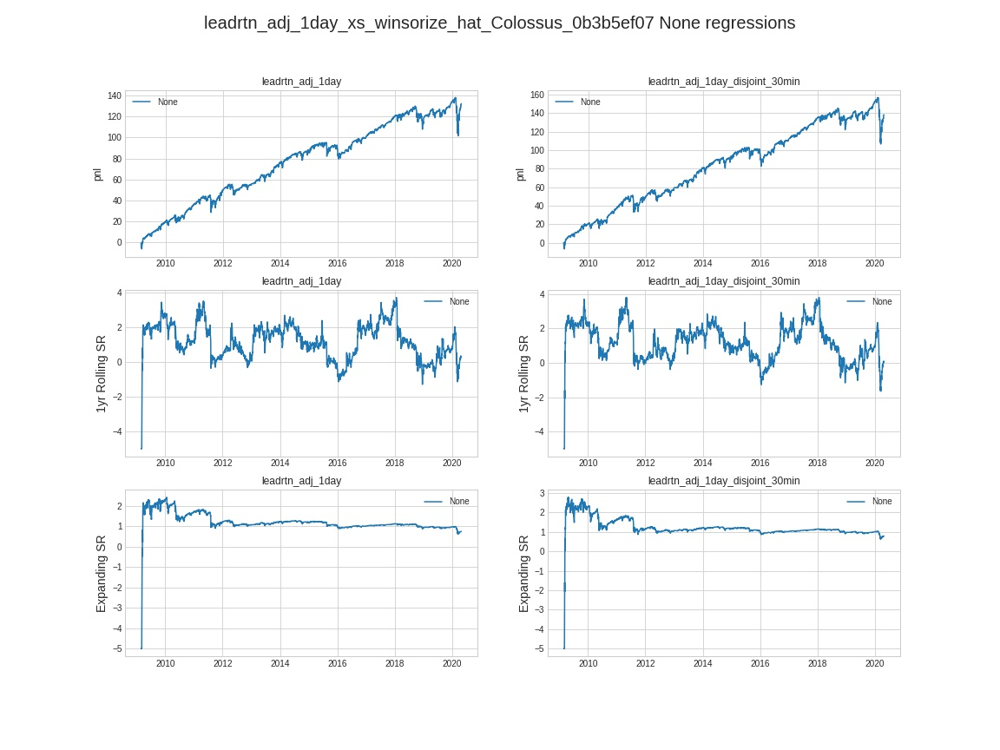

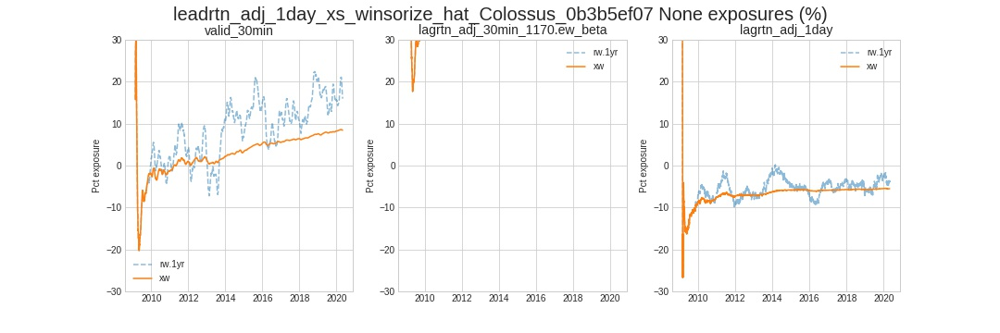

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0b3b5ef07,fcst_0


,fcst_0
fcst_0,1.0


,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.981585,0.976333


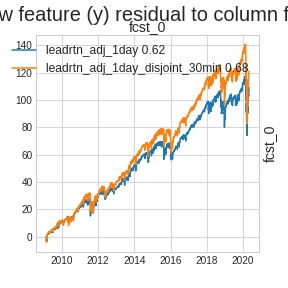

,ac_1,ac_2
x,fcst_0,fcst_0
y,,
fcst_0,0.981585,0.976333


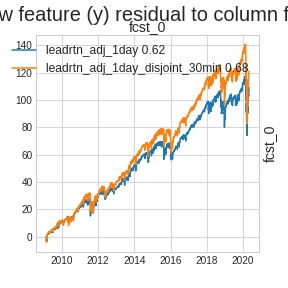

In [43]:
# 'Colossus_0b3b5ef07'
############################################################################
BASELINE_NAME =  'Colossus_0b3b5ef07'
PREV_BASELINE = 'Colossus_3c3fe09f4'
BASELINE_NOTES = 'linear centauri with pca features, H=5, hydra ,  Γ and Ω, last ensembling'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(2,2000),  num_its=1, 
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', tv=None, ortho=5, boost=50, loss='l2', kappa=2, halflife_kappa=None, mode='last', ridge=1e-4,   end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
            lr=1e-1, halflife_polyak=None, halflifes_adam=10,  priming=1000, hyper_tune=None, 
        ),
        corpii = [
            mx.HPSet(                 
                type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7,  use_bias=True, H=1, dropout=None, K=20, 
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                lr=1e-7,halflifes_adam=10, halflife_polyak=10,  priming=300, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
            ),
            mx.HPSet(                 
                type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, use_bias=True, H=5, dropout=0.50, K=20, 
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                lr=1e-7,halflifes_adam=10, halflife_polyak=10,  priming=300, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
            ),
            mx.HPSet( 
                type='gamma', ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=10, ma=None, dilation=1,
                C_transformer=None, 
                Yh_transformer=[
                    mx.HPSet( type='wins', quantiles=0.05 ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) 
                ],                   
                lr=10, halflife_polyak=10, halflifes_adam=10, priming=200, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),                
            ),            
            mx.HPSet( 
                type='hydra',  ridge=1e-4, use_bias=True, H=3, 
                transformer = [ 
                    mx.HPSet( type='norm', halflife=None, clip=None, demean=False, normalize=True ), 
                ],
               lr=1e-7, priming=1500, halflife_polyak=10, halflifes_adam=10, hyper_tune= None, #dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='omega',  ridge=1e-12, act=None,
                transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
                lr=10, halflife_polyak=5, halflifes_adam=10, priming=100, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
            ),
        #     mx.HPSet( 

        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_0fc2247f2
## bilinear centauri with pca features,  hydra ,  Γ and Ω, last ensembling (follows Colossus_0b3b5ef07) 


,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,21092.518792,1.115674,0.016315,0.000266,20.20598,2.315517,0.965404,0.958643,0.923415
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,21092.518792,1.184200,0.015779,0.000249,19.54241,1.891009,0.965404,0.958643,0.923415


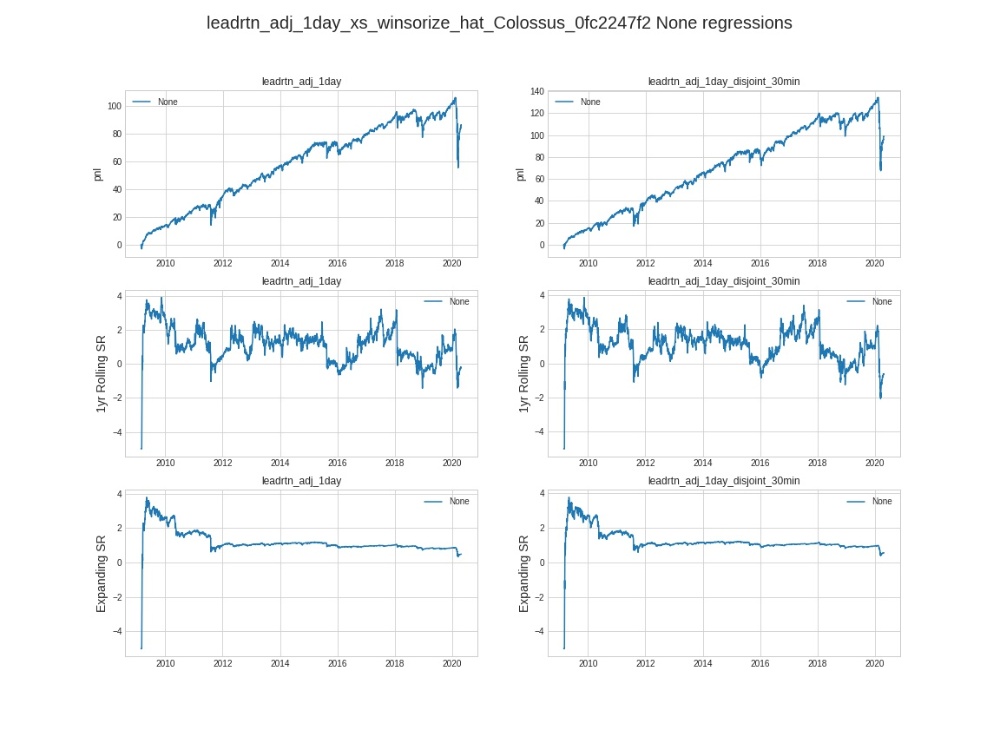

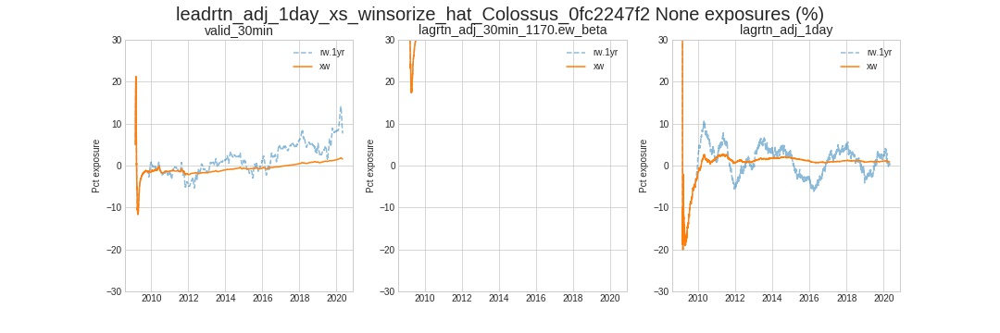

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0b3b5ef07,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0fc2247f2,fcst_1


,fcst_0,fcst_1
fcst_0,1.000000,0.641544
fcst_1,0.641544,1.000000


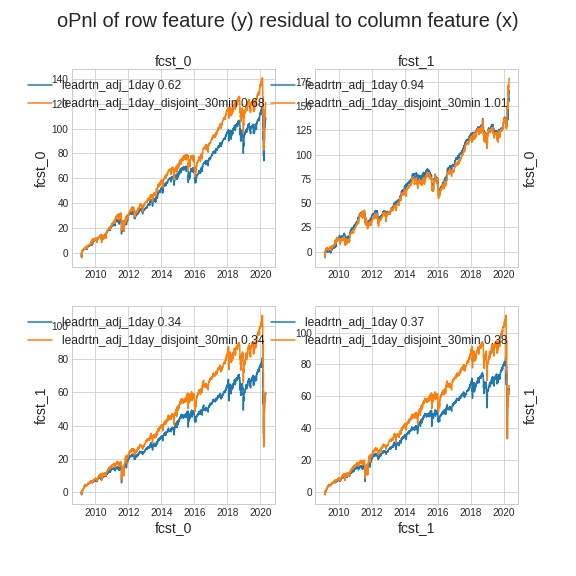

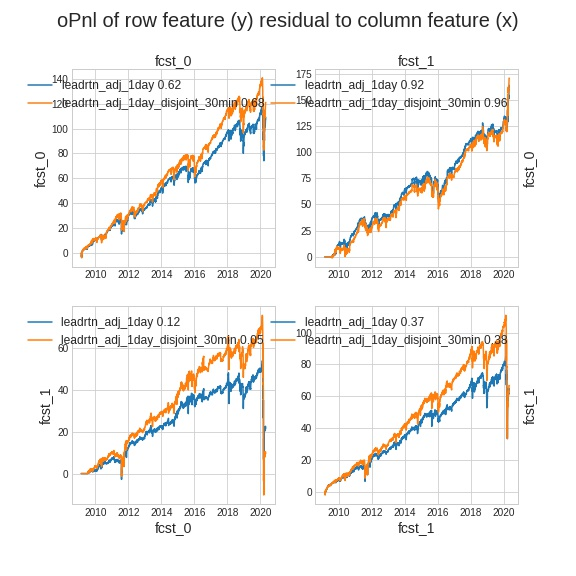

In [47]:
# Colossus_0fc2247f2
############################################################################
BASELINE_NAME = 'Colossus_0fc2247f2'
PREV_BASELINE =  'Colossus_0b3b5ef07'
BASELINE_NOTES = 'bilinear centauri with pca features,  hydra ,  Γ and Ω, last ensembling'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(2,2000),  num_its=1, 
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', tv=None, ortho=5, boost=50, loss='l2', kappa=2, halflife_kappa=None, mode='last', ridge=1e-4,   end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
            lr=1e-1, halflife_polyak=None, halflifes_adam=10,  priming=1000, hyper_tune=None, 
        ),
        corpii = [
            mx.HPSet(                 
                type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7,  use_bias=True, H=1, dropout=None, K=20, 
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                lr=1e-7,halflifes_adam=10, halflife_polyak=10,  priming=300, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
            ),
#             mx.HPSet(                 
#                 type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, use_bias=True, H=5, dropout=0.50, K=20, 
#                 transformer = [ 
#                     mx.HPSet( type='wins', quantiles=0.05 ),  
#                     mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
#                     mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
#                 lr=1e-7,halflifes_adam=10, halflife_polyak=10,  priming=300, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
#             ),
            mx.HPSet( 
                type='gamma', ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=10, ma=None, dilation=1,
                C_transformer=None, 
                Yh_transformer=[
                    mx.HPSet( type='wins', quantiles=0.05 ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) 
                ],                   
                lr=10, halflife_polyak=10, halflifes_adam=10, priming=200, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),                
            ),            
            mx.HPSet( 
                type='hydra',  ridge=1e-4, use_bias=True, H=3, 
                transformer = [ 
                    mx.HPSet( type='norm', halflife=None, clip=None, demean=False, normalize=True ), 
                ],
               lr=1e-5, priming=1500, halflife_polyak=10, halflifes_adam=10, hyper_tune= None, #dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='omega',  ridge=1e-12, act=None,
                transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
                lr=10, halflife_polyak=5, halflifes_adam=10, priming=100, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
            ),
        #     mx.HPSet( 

        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# Colossus_cccaf6aa3
## bilinear ARMA centauri with pca features,  hydra ,  Γ and Ω, last ensembling (follows Colossus_0fc2247f2)

,,n,finite_frac,tilt,pmSR,ic,r2,tstat,DK_60,ac_1,ac_2,ac_13
returns,lag,,,,,,,,,,,
leadrtn_adj_1day,NaN,1665888,0.920908,995.893937,1.304106,0.014974,0.000224,18.534639,2.500593,0.995647,0.994339,0.978172
leadrtn_adj_1day_disjoint_30min,NaN,1665888,0.920573,995.893937,1.280650,0.013672,0.000187,16.916676,2.050933,0.995647,0.994339,0.978172


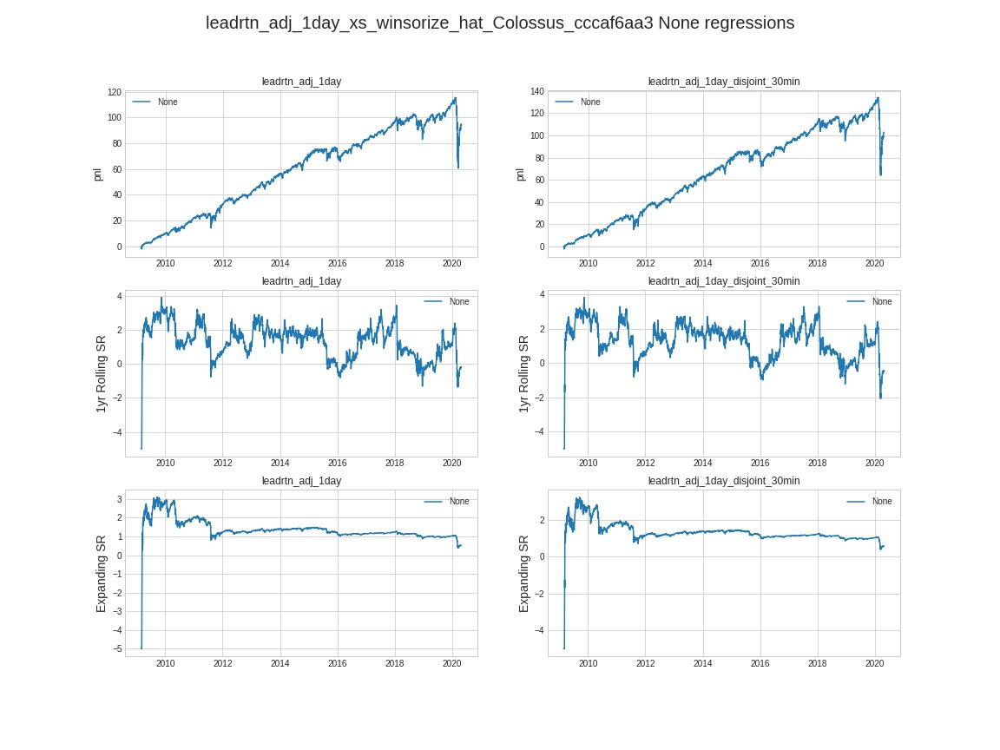

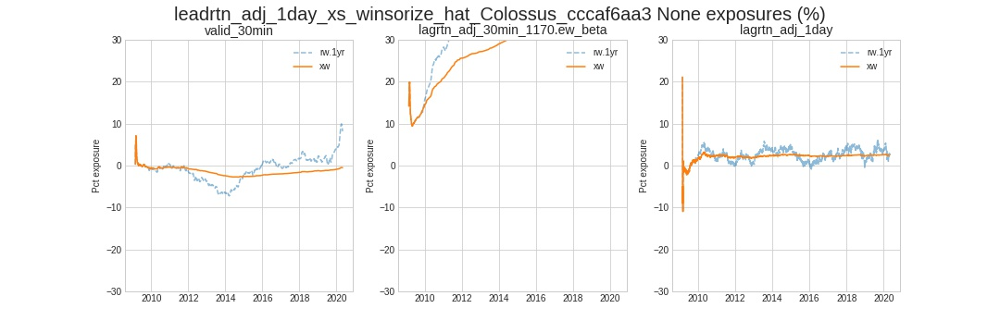

,0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0b3b5ef07,fcst_0
leadrtn_adj_1day_xs_winsorize_hat_Colossus_0fc2247f2,fcst_1
leadrtn_adj_1day_xs_winsorize_hat_Colossus_cccaf6aa3,fcst_2


,fcst_0,fcst_1,fcst_2
fcst_0,1.000000,0.641544,0.358616
fcst_1,0.641544,1.000000,0.729251
fcst_2,0.358616,0.729251,1.000000


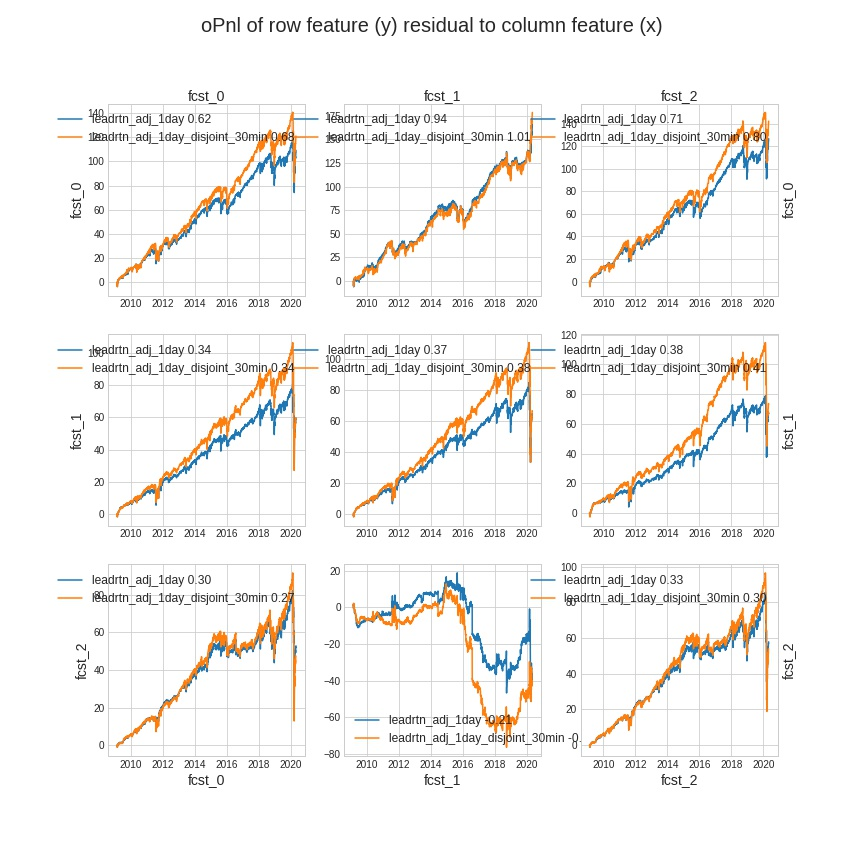

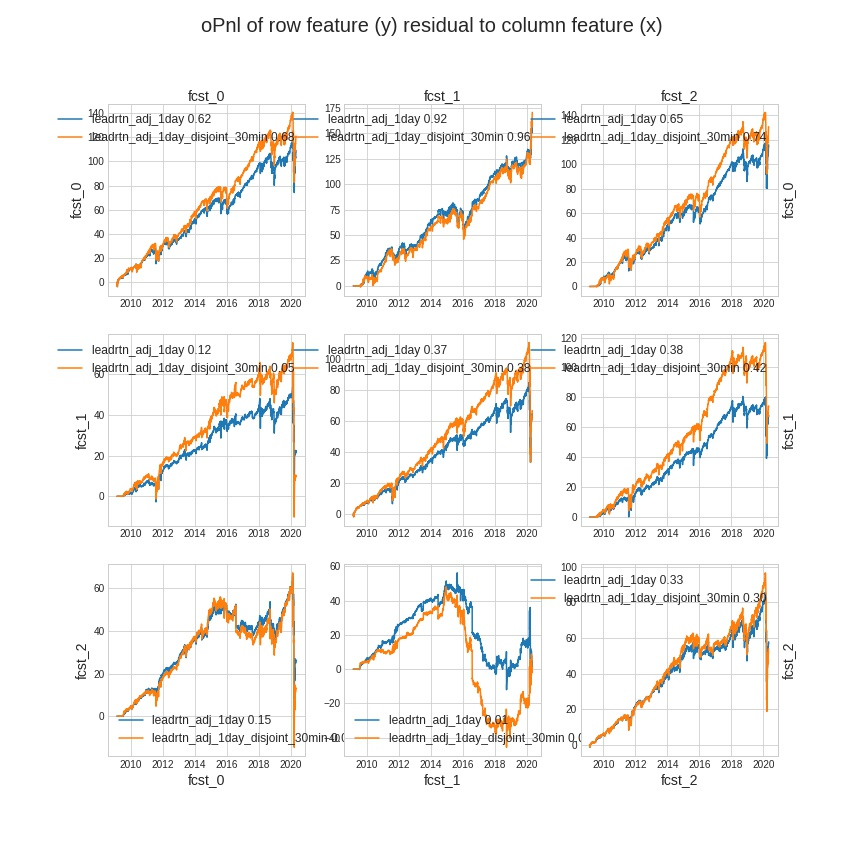

In [49]:
# Colossus_cccaf6aa3
############################################################################
BASELINE_NAME = 'Colossus_cccaf6aa3'
PREV_BASELINE = 'Colossus_0fc2247f2'
BASELINE_NOTES = 'bilinear ARMA centauri with pca features,  hydra ,  Γ and Ω, last ensembling'
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = True

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 1
data = daily_boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_1day', 'leadrtn_adj_1day_disjoint_30min' ],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min_13.rw_mean', 'log_open_unadj_30min', 'open_unadj_30min' ]
        + hps.feature_set.lagging_daily
        + hps.feature_set.vol
        + hps.feature_set.log_volumes_daily
        # + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.betas
        + hps.feature_set.technical
        #+ hps.feature_set.afacs                
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt_daily
        + hps.feature_set.vol
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_1day'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=2000, burn_in=(2,2000),  num_its=1, 
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', tv=None, ortho=5, boost=50, loss='l2', kappa=2, halflife_kappa=None, mode='last', ridge=1e-4,   end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
            lr=1e-1, halflife_polyak=None, halflifes_adam=10,  priming=1000, hyper_tune=None, 
        ),
        corpii = [
            mx.HPSet(                 
                type='centauri', mode='bilinear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7,  use_bias=True, H=1, dropout=None, K=20, 
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                lr=1e-8,halflifes_adam=10, halflife_polyak=10,  priming=300, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
            ),
#             mx.HPSet(                 
#                 type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, use_bias=True, H=5, dropout=0.50, K=20, 
#                 transformer = [ 
#                     mx.HPSet( type='wins', quantiles=0.05 ),  
#                     mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
#                     mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
#                 lr=1e-7,halflifes_adam=10, halflife_polyak=10,  priming=300, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),
#             ),
            mx.HPSet( 
                type='gamma', ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=10, ma=None, dilation=1,
                C_transformer=None, 
                Yh_transformer=[
                    mx.HPSet( type='wins', quantiles=0.05 ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) 
                ],                   
                lr=10, halflife_polyak=10, halflifes_adam=10, priming=200, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ),                
            ),            
            mx.HPSet( 
                type='hydra',  ridge=1e-4, use_bias=True, H=3, 
                transformer = [ 
                    mx.HPSet( type='norm', halflife=None, clip=None, demean=False, normalize=True ), 
                ],
               lr=1e-5, priming=1500, halflife_polyak=10, halflifes_adam=10, hyper_tune= None, #dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            ),
            mx.HPSet( 
                type='omega',  ridge=1e-12, act=None,
                transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
                lr=10, halflife_polyak=5, halflifes_adam=10, priming=100, hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
            ),
        #     mx.HPSet( 

        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# 30min linear model - FAILED
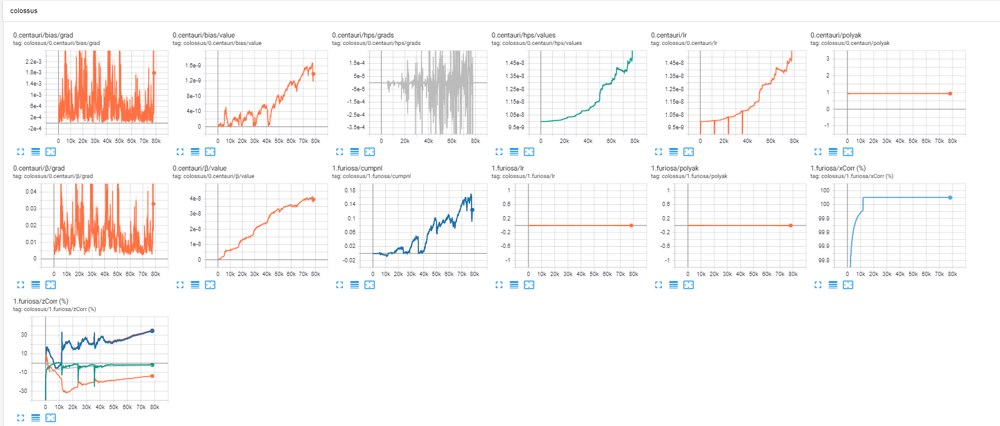

In [ ]:
#  30min linear model - FAILED -
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_e4cd9af31'
BASELINE_NOTES = '(30min) linear centauri with pca features '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        # + hps.feature_set.afacs                    
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,10000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='linear', act=None, ma=10, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20, halflife_polyak=10,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            )
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# 30 min linear model with pca feautres and higher LR -- much better

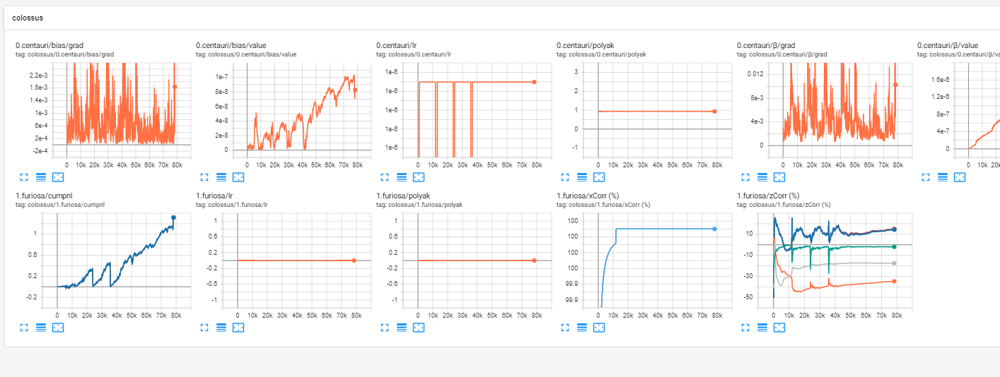


In [ ]:
#  30min linear model with pca features (higher lr)
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_e4cd9af31'
BASELINE_NOTES = '(30min) linear centauri with pca features '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        # + hps.feature_set.afacs                    
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,10000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1, priming=200,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa',  tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-6, use_bias=True, H=1, dropout=None, K=20, halflife_polyak=10,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            )
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



# (30min) linear centauri, low lr without pca features (not great)
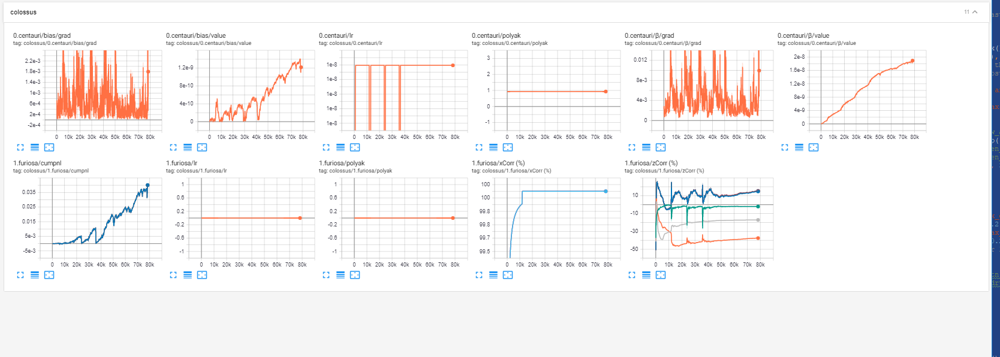

In [ ]:
#  30min linear model  withotu pca features
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_e4cd9af31'
BASELINE_NOTES = '(30min) linear centauri, low lr without pca features '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        # + hps.feature_set.afacs                    
        # + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,10000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-8, use_bias=True, H=1, dropout=None, K=20, halflife_polyak=10,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                # hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            )
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



/home/fj/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1392: RuntimeWarning: All-NaN slice encountered
  overwrite_input, interpolation)


#  30min linear model with pca features (no ma)
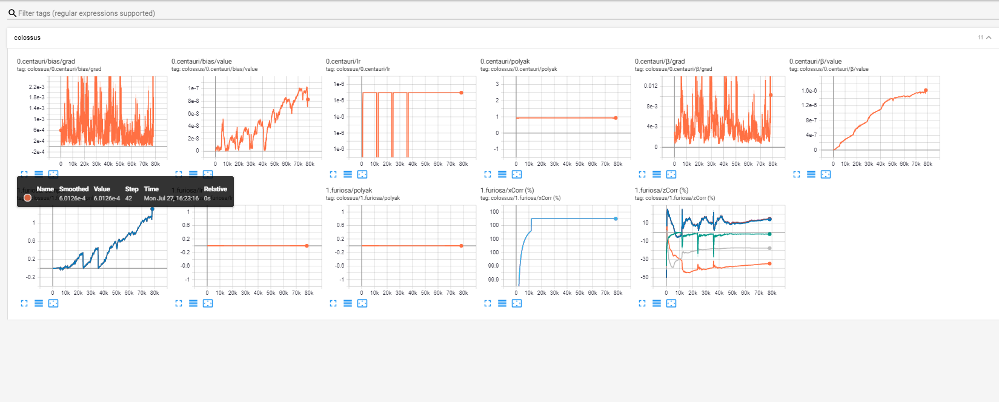

In [ ]:
#  30min bilinear model with pca features (no ma)
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_e4cd9af31'
BASELINE_NOTES = ' 30min bilinear model  with pca features (no ma) '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        # + hps.feature_set.afacs                    
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,10000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='linear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-6, use_bias=True, H=1, dropout=None, K=20, halflife_polyak=10,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                # hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            )
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



> /home/fj/cloud/code/madmax/furyroad/colossus.py(381)_ColossusOperator()
-> data = data.assign_features( forecast=Yh )
(Pdb) Yh.shape
(43082, 592, 1)
(Pdb) Yh
<xarray.DataArray (time: 43082, symbol: 592, features: 1)>
array([[[-0.70308154],
        [-0.70308154],
        [-0.70308154],
        ...,
        [-0.70308154],
        [-0.70308154],
        [-0.70308154]],

       [[-0.64946236],
        [-0.64946236],
        [-0.64946236],
        ...,
        [-0.64946236],
        [-0.64946236],
        [-0.64946236]],

       [[-0.57842384],
        [-0.57842384],
        [-0.57842384],
        ...,
        [-0.57842384],
        [-0.57842384],
        [-0.57842384]],

       ...,

       [[-0.04420869],
        [-0.16165567],
        [-0.23586962],
        ...,
        [-1.56618674],
        [-0.42420315],
        [-0.65500659]],

       [[ 0.13832401],
        [-0.2806134 ],
        [-0.2104492 ],
        ...,
        [-1.29206455],
        [-0.66982849],
        [-1.10099776]],

   

#  30min bilinear model with pca features (no ma)
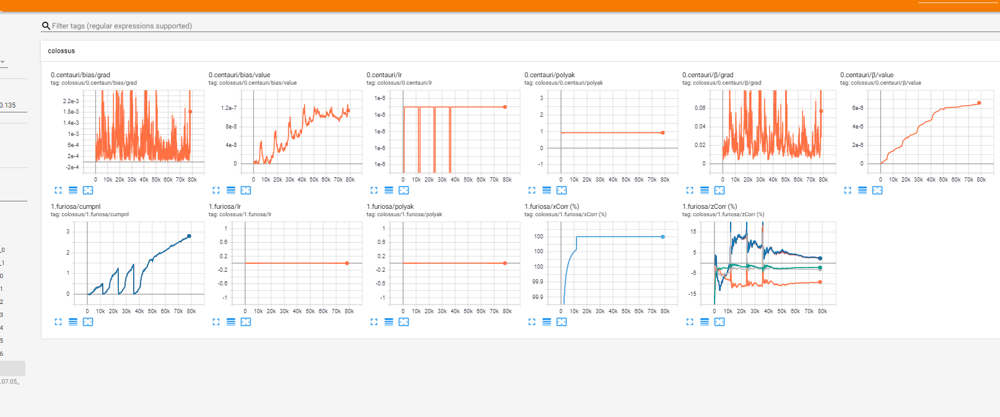

In [13]:
#  30min bilinear model with pca features (no ma)
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_e4cd9af31'
BASELINE_NOTES = ' 30min bilinear model  with pca features (no ma) '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        # + hps.feature_set.afacs                    
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,10000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=None, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-6, use_bias=True, H=1, dropout=None, K=20, halflife_polyak=10,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                # hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            )
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )



,num_calls,duration_total,duration_mean,duration_squared,duration_std
concating,15,0.499434,0.031215,0.002674,0.041226
converting,15,0.109974,0.006873,0.000334,0.016922


,name,type,shape,numel,norm,dtype,device,arguments
0,,Colossus,,5477,6.738486e-06,,,"{'corpii': [CentauriCorpus( act=None, r..."
1,corpii/,ModuleList,,5477,6.738486e-06,,,{'modules': <bound method Module.modules of Mo...
2,corpii/0/,CentauriCorpus,,5477,6.738486e-06,,,"{'act': None, 'ridge': 1e-07, 'ar': 10, 'ma': ..."
3,corpii/0/β,Parameter,"(1, 74, 74, 1)",5476,6.623201e-06,torch.float64,cuda:0,
4,corpii/0/bias,Parameter,"(1,)",1,1.152846e-07,torch.float64,cuda:0,
5,corpii/0/transformer/,OnlineSequential,,0,0.000000e+00,,,{'args': <class 'inspect._empty'>}
6,corpii/0/transformer/_module_list/,ModuleList,,0,0.000000e+00,,,{'modules': <bound method Module.modules of Mo...
7,corpii/0/transformer/_module_list/0/,OnlineWinsorize,,0,0.000000e+00,,,{'quantiles': 0.05}
8,corpii/0/transformer/_module_list/0/_wins/,Winsorize,,0,0.000000e+00,,,"{'quantiles': [0.05, 0.95], 'dim': 0}"
9,corpii/0/transformer/_module_list/1/,OnlineNorm,,0,0.000000e+00,,,"{'demean': True, 'normalize': True, 'clip': 3,..."


KeyError: "not all values found in index 'features'"

In [ ]:
#  30min bilinear model with pca features (with ma)
############################################################################
BASELINE_NAME = None
PREV_BASELINE =  'Colossus_e4cd9af31'
BASELINE_NOTES = ' 30min bilinear model  with pca features (no ma) '
if PREV_BASELINE and BASELINE_NOTES:
    BASELINE_NOTES += f' (follows {PREV_BASELINE}) '
make_baseline = False

disp( BASELINE_NAME, h=1 )
disp( BASELINE_NOTES, h=3 )    

# set the input data
INTS_PER_DAY = 13
data = boosted_pca 

phps = mx.HPSet(
    # stuff related to pre and post processing
    start=hps.start,
    end=hps.end,  #
    # related to preprocessing
    preprocess=mx.HPSet(
        symbol=None,
        zscore_target=False, #zscore returns
        winsorize_target=0.01, #winsorize returns
        winsorize_features=None, # winsorize features
        demean_features=False,
        normalize_features=False,
        winsorize_weight=None, #winsorizes the learning weight (not the regression weight)
        winsorize_orthos=None,
        normalize_orthos=True,
        demean_conditioners=True,
        normalize_conditioners=True,
    ),        
    # hps related to profiling
    profiling=mx.HPSet(
        xsw=False,
        xsz=False,
        clip=None,
        exposures=['valid_30min', 'lagrtn_adj_30min_1170.ew_beta', 'lagrtn_adj_1day'],
        targets=['leadrtn_adj_30min', 'leadrtn_adj_30min_disjoint.1'],
        weight='valid_30min',
        
    ),
    # the feature sets
    features=sorted( set(
        []
        + ['open_unadj_30min', 'log_open_unadj_30min', 'lagrtn_adj_30min_resid', ]
        + hps.feature_set.lagging
        + hps.feature_set.vol
        + hps.feature_set.log_volumes
        # + hps.feature_set.calendar
        + hps.feature_set.mkt
        + hps.feature_set.betas
        + hps.feature_set.technical
        # + hps.feature_set.afacs                    
        + hps.feature_set.pca_features
    ) ),
    conditioners=sorted( set(
        [] 
        + hps.feature_set.calendar
        + hps.feature_set.mkt
    )),    
    lookahead=2, #global lookahead
    targets=(
        []
        +['leadrtn_adj_30min'] 
    ),
    # feautres to orthogonal out
    ortho_features=(
        []                
        + ['valid_30min', 'lagrtn_adj_30min', 'lagrtn_adj_1day']  # tilt and mean revrsion        
        + hps.feature_set.betas # market
    ),
    weight='valid_30min',    
      colossus=mx.HPSet(        
        end_to_end=False, minibatch=30, batch_size=3000, burn_in=(3,10000), halflife_polyak=None, halflifes_adam=10, hyper_tune=None,  num_its=1,
        # furiosa specs
        furiosa=mx.HPSet(
            type='furiosa', priming=200, tv=None, ortho=5, boost=5, loss='l2', kappa=2, halflife_kappa=None, mode=None,  lr=1e-1, ridge=1e-4, halflife_polyak=10, end_to_end=False,
            transformer=[ mx.HPSet( type='norm', demean=True, normalize=True, halflife=None, clip=3 ) ], 
        ),
        corpii = [
            mx.HPSet( 
                type='centauri', mode='bilinear', act=None, ma=INTS_PER_DAY * 2, ar=10, use_X=True, dilation=1, ridge=1e-7, lr=1e-6, use_bias=True, H=1, dropout=None, K=20, halflife_polyak=10,
                transformer = [ 
                    mx.HPSet( type='wins', quantiles=0.05 ),  
                    mx.HPSet( type='norm', halflife=100, clip=3, demean=True, normalize=True ), 
                    mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=True )],
                # hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) ) 
            )
        #     mx.HPSet( 
        #         type='gamma', lr=1, ridge=1e-5, use_C=True, use_bias=True, mode='linear', act=None, ar=None, ma=None, dilation=1,
        #         C_transformer=None, 
        #         Yh_transformer=[mx.HPSet( type='wins', quantiles=0.05 ), mx.HPSet( type='norm', halflife=None, clip=9, demean=False, normalize=False ) ],                   
        #         #hyper_tune=dict( hypergrad=dict( lr=1e3, decay=0.80, ridge=0, style='log' ) ) 
        #     ),
        #     mx.HPSet( 
        #         type='omega', lr=1, ridge=1e-12, halflife_polyak=5, act='tanh',
        #         transformer=[mx.HPSet( type='wins', quantiles=0.05 ) ],
        #         #hyper_tune=dict( lr=dict( lr=1, decay=0.80, ridge=0, style='log' ) )
        #     ),
        ]
    )
)

mxtr = mxtr.reload()
import madmax.furyroad as mxf; mxf = mxf.reload()
from research.etf_technical import furyroad_runner as refr; reload( refr )
Config.start()

# is this baselined  - then load from baseline cache
baseline = None
if BASELINE_NAME:
    try:
        baseline = mx.Baseline.load( BASELINE_NAME )
        assert baseline.hps == phps, 'failure to valdiate hyperparams'
        #disp( 'loaded ',  BASELINE_NAME, ' from baseline cache', h=3, color='orange' )        
        output_meta = baseline.output_meta
        output_features = baseline.output_features
    except Exception as e:
        disp( 'did not find ', BASELINE_NAME, 'in baseline cache because ', e, '\n  running', h=3, color='purple' )
        
# run the runner if needed
if baseline is None:
    disp( mx.tensorboard.kill_server( ) )
    disp( mx.tensorboard.start( clear=True ) )    
    disp( mx.tensorboard.start_server( ) )
    runner = refr.run_pipeline( data, hps=phps,  prev_baseline=PREV_BASELINE, memoize=True, verbose=True, dtype=tr.float64 )
    disp( f'Expected {BASELINE_NAME}  got ', runner.name, h=4, color='teal' )
    runner.run()
    output_meta =  runner.output_meta
    output_features = runner.output_features
    # baseline this if needed
    if make_baseline:
        # let's give this fucker a name
        if not BASELINE_NAME: 
            BASELINE_NAME = runner.name
        baseline = mx.Baseline.make( runner, hps=phps, notebook=Config.code,  notes=BASELINE_NOTES,  name=BASELINE_NAME   )
        disp( 'Baselined ', BASELINE_NAME, h=2, color='teal' )
    else:
        baseline = runner

# --- show the results---
for profile in output_meta['profiler']:
    main_fig = profile['main_fig']
    exp_fig = profile['exp_fig']
    reg_fig = profile['reg_fig'] 
    reg_df = profile['regressions']
    if not reg_df.empty: reg_df = reg_df.set_index( ['returns', 'lag'] )
    disp( profile['feature'],  h=3, hr=True )    
    disp( reg_df, h=4 )
    disp( reg_fig  )
    disp( exp_fig )    
    
comparator = mx.ForecastComparator( targets=phps.profiling.targets, weight=phps.profiling.weight, winlen=100 )
_ = comparator.compare( baseline, forecasts=baseline.output_features[-5:] )

